In [90]:
import wfdb
import numpy as np
import pywt
import matplotlib.pyplot as plt

In [91]:
record = wfdb.rdrecord('./data/nsrdb/16265')

In [92]:
record.p_signal

array([[-0.165, -0.325],
       [-0.155, -0.325],
       [-0.195, -0.305],
       ...,
       [-0.05 , -0.095],
       [-0.05 , -0.085],
       [-0.05 , -0.085]])

In [93]:
record.p_signal[:, 0]

array([-0.165, -0.155, -0.195, ..., -0.05 , -0.05 , -0.05 ])

In [94]:
signal = record.p_signal[:, 0]

In [95]:
record.__dict__

{'record_name': '16265',
 'n_sig': 2,
 'fs': 128,
 'counter_freq': None,
 'base_counter': None,
 'sig_len': 11730944,
 'base_time': datetime.time(8, 4),
 'base_date': None,
 'comments': ['32 M'],
 'sig_name': ['ECG1', 'ECG2'],
 'p_signal': array([[-0.165, -0.325],
        [-0.155, -0.325],
        [-0.195, -0.305],
        ...,
        [-0.05 , -0.095],
        [-0.05 , -0.085],
        [-0.05 , -0.085]]),
 'd_signal': None,
 'e_p_signal': None,
 'e_d_signal': None,
 'file_name': ['16265.dat', '16265.dat'],
 'fmt': ['212', '212'],
 'samps_per_frame': [1, 1],
 'skew': [None, None],
 'byte_offset': [None, None],
 'adc_gain': [200.0, 200.0],
 'baseline': [0, 0],
 'units': ['mV', 'mV'],
 'adc_res': [12, 12],
 'adc_zero': [0, 0],
 'init_value': [-33, -65],
 'checksum': [15756, -21174],
 'block_size': [0, 0]}

In [96]:
fs = record.fs
segment_duration = 5 * 60  # 5 minutes in seconds
samples_per_segment = fs * segment_duration

In [97]:
print(f"""
fs = {fs}
segment_duration = {segment_duration}
samples_per_segment = {samples_per_segment}
""")


fs = 128
segment_duration = 300
samples_per_segment = 38400



In [98]:
signal.shape

(11730944,)

In [99]:
segments = [signal[i:i + samples_per_segment] for i in range(0, len(signal), samples_per_segment)]

In [100]:
segments

[array([-0.165, -0.155, -0.195, ..., -0.295, -0.135, -0.295]),
 array([-0.285, -0.285, -0.185, ..., -0.365,  1.475,  2.795]),
 array([ 2.935,  2.535,  0.605, ..., -0.195, -0.145, -0.165]),
 array([-0.145, -0.115, -0.125, ..., -0.145, -0.145, -0.135]),
 array([-0.175, -0.135, -0.175, ..., -0.135, -0.135, -0.105]),
 array([-0.115, -0.125, -0.115, ..., -0.135, -0.175, -0.175]),
 array([-0.155, -0.115, -0.155, ..., -0.165, -0.165, -0.175]),
 array([-0.175, -0.185, -0.175, ..., -0.765, -0.855, -0.005]),
 array([ 1.865,  2.825,  2.685, ..., -0.295, -0.315, -0.315]),
 array([-0.295, -0.295, -0.275, ..., -0.185, -0.205, -0.185]),
 array([-0.165, -0.185, -0.165, ..., -0.075, -0.055, -0.015]),
 array([ 0.005,  0.045,  0.075, ..., -0.105, -0.135, -0.065]),
 array([-0.055, -0.035, -0.095, ..., -0.105, -0.115, -0.135]),
 array([-0.055, -0.005, -0.055, ..., -0.055, -0.095, -0.145]),
 array([-0.195, -0.065, -0.125, ..., -0.185, -0.145, -0.165]),
 array([-0.195, -0.195, -0.165, ..., -0.225, -0.135, -0

In [101]:
segments[0].shape

(38400,)

In [102]:
len(segments)

306

In [103]:
segments[305].shape

(18944,)

In [104]:
segments[304].shape

(38400,)

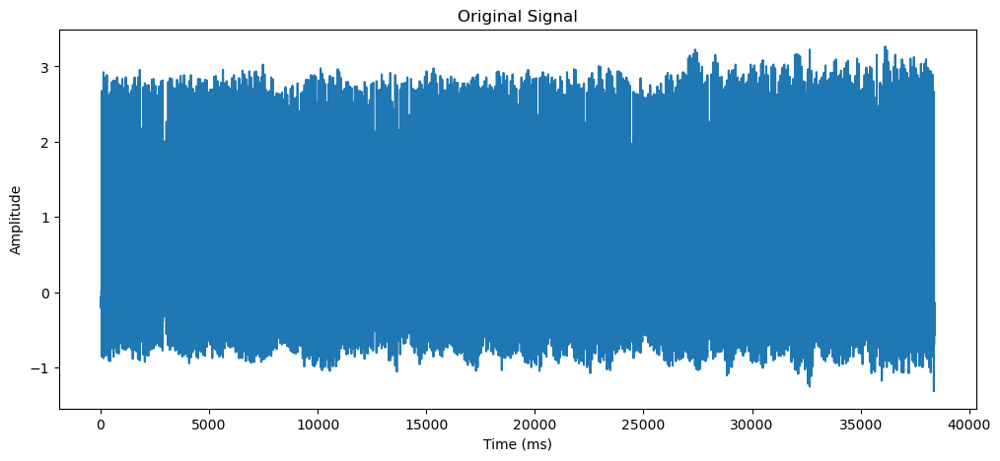

In [105]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(segments[0])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

# Ex

In [106]:
record_ex_1 = wfdb.rdrecord('./data/nsrdb/16265', channels = [0])

In [107]:
record_ex_1.p_signal

array([[-0.165],
       [-0.155],
       [-0.195],
       ...,
       [-0.05 ],
       [-0.05 ],
       [-0.05 ]])

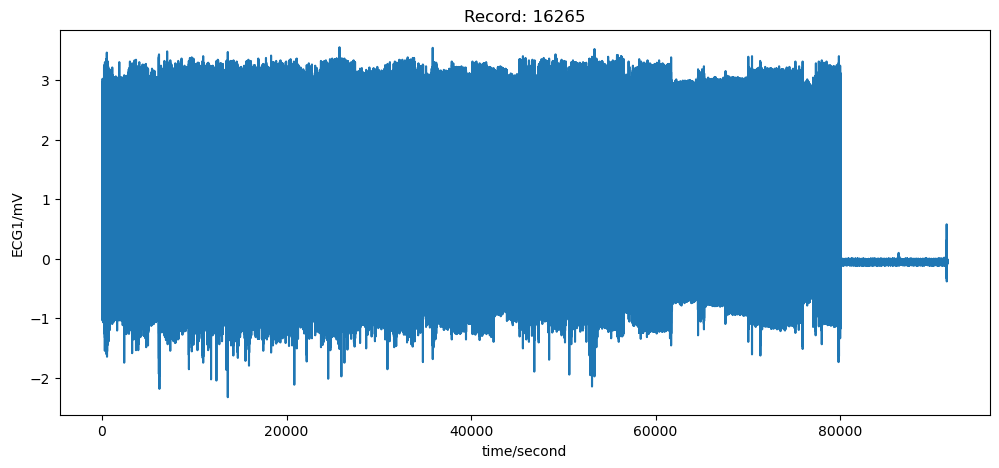

In [108]:
wfdb.plot_wfdb(record=record_ex_1, 
               plot_sym=True,
               time_units='seconds', 
               title='',
               figsize=(12,5), 
               ecg_grids='')

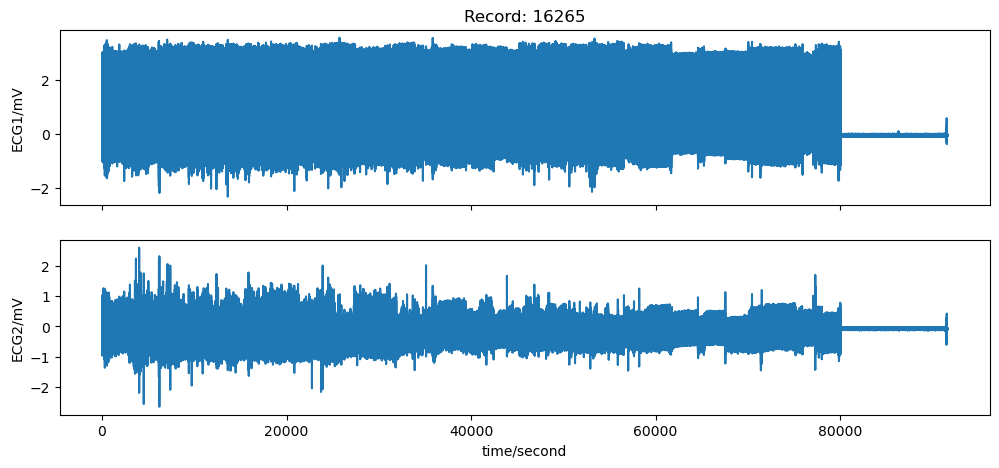

In [109]:
wfdb.plot_wfdb(record=record, 
               plot_sym=True,
               time_units='seconds', 
               title='',
               figsize=(12,5), 
               ecg_grids='')

# DENOISE

In [110]:
def denoise_signal_1(signal, wavelet='sym5', level=5):
    coeffs = pywt.wavedec(signal, wavelet, level=level)
    coeffs[1:] = [pywt.threshold(c, np.std(c) * 0.5, mode='soft') for c in coeffs[1:]]  # Denoising
    return pywt.waverec(coeffs, wavelet)

In [111]:
sig_denoised_ex_1 = denoise_signal_1(segments[0])

In [112]:
sig_denoised_ex_1

array([-0.16203132, -0.16108758, -0.16032075, ..., -0.22999981,
       -0.11132685, -0.20980459])

In [113]:
segments[0]

array([-0.165, -0.155, -0.195, ..., -0.295, -0.135, -0.295])

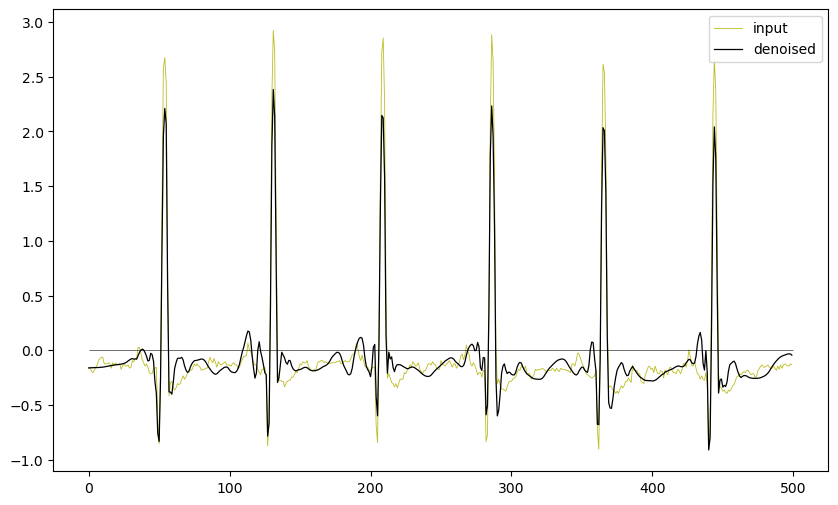

In [114]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][0:500], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_1[0:500], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

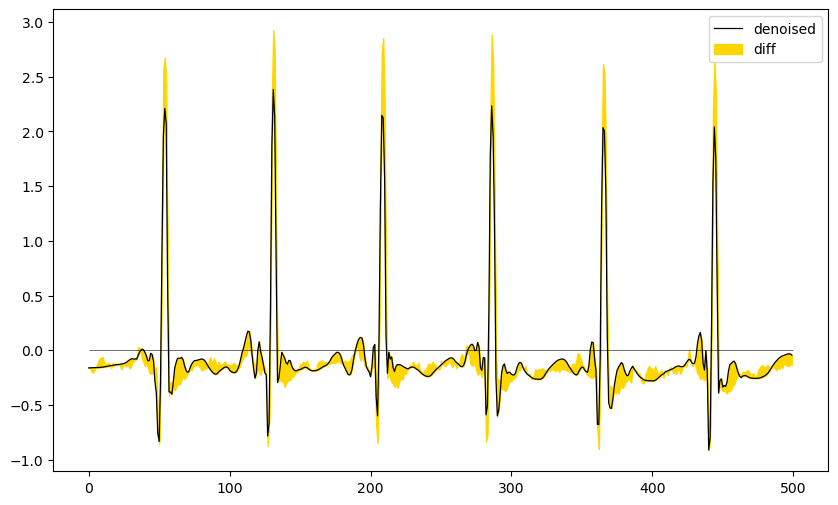

In [115]:
plt.figure(figsize=(10,6))
plt.plot(sig_denoised_ex_1[0:500], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,500,1),segments[0][0:500],sig_denoised_ex_1[0:500],color='gold',label = 'diff')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [116]:
# denoise 2

In [117]:
def denoise_signal_2(X, dwt_transform, dlevels, cutoff_low, cutoff_high):
    coeffs = pywt.wavedec(X, dwt_transform, level=dlevels)   # wavelet transform 'bior4.4'
    # scale 0 to cutoff_low 
    for ca in range(0,cutoff_low):
        coeffs[ca]=np.multiply(coeffs[ca],[0.0])
    # scale cutoff_high to end
    for ca in range(cutoff_high, len(coeffs)):
        coeffs[ca]=np.multiply(coeffs[ca],[0.0])
    Y = pywt.waverec(coeffs, dwt_transform) # inverse wavelet transform
    return Y  

In [118]:
sig_denoised_ex_2 = denoise_signal_2(segments[0],'bior4.4', 9 , 1 , 7)

In [119]:
sig_denoised_ex_2

array([-0.05738883, -0.05389205, -0.05006987, ..., -0.08924633,
       -0.0838864 , -0.08217666])

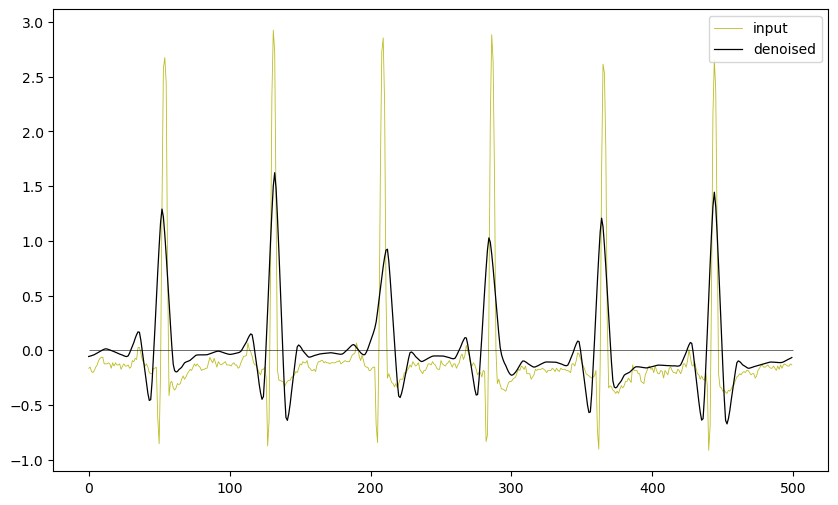

In [120]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][0:500], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_2[0:500], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

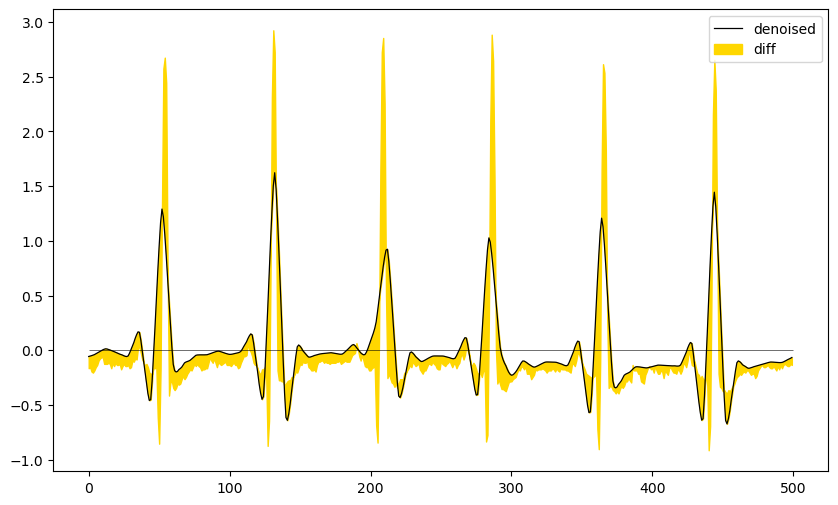

In [121]:
plt.figure(figsize=(10,6))
plt.plot(sig_denoised_ex_2[0:500], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,500,1),segments[0][0:500],sig_denoised_ex_2[0:500],color='gold',label = 'diff')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [122]:
# 3 den

In [123]:
sig_denoised_ex_3 = denoise_signal_2(segments[0],'sym5', 8 , 0 , 7) # 8 level fine (8, 0, 7)

In [124]:
sig_denoised_ex_3

array([-0.18560928, -0.18882417, -0.18643256, ..., -0.2573018 ,
       -0.22254005, -0.21986917])

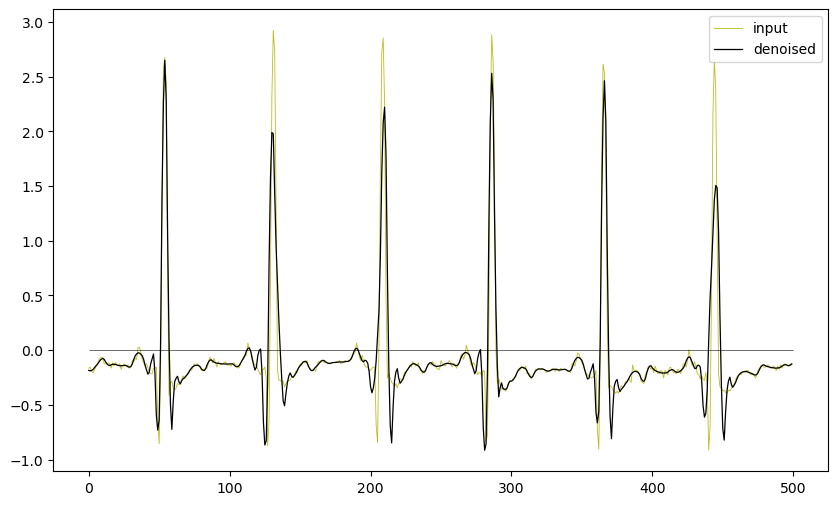

In [125]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][0:500], color='tab:olive', linewidth=0.6,label = 'input')
plt.plot(sig_denoised_ex_3[0:500], color='black', linewidth=0.9,label = 'denoised')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

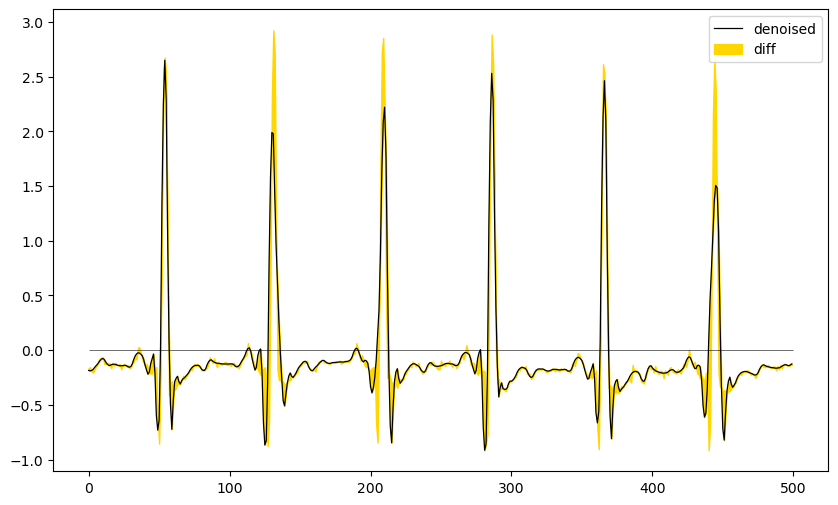

In [126]:
plt.figure(figsize=(10,6))
plt.plot(sig_denoised_ex_3[0:500], color='black', linewidth=0.9,label = 'denoised')
plt.fill_between(np.arange(0,500,1),segments[0][0:500],sig_denoised_ex_3[0:500],color='gold',label = 'diff')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

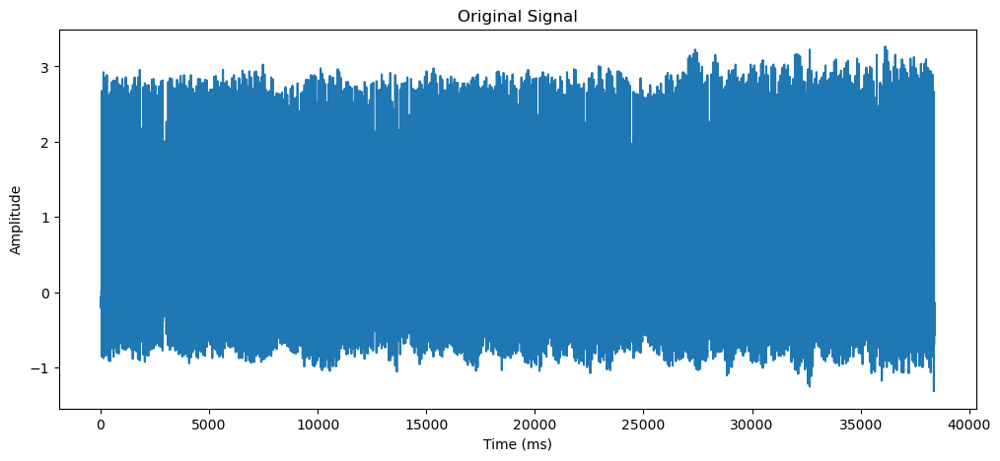

In [127]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(segments[0])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

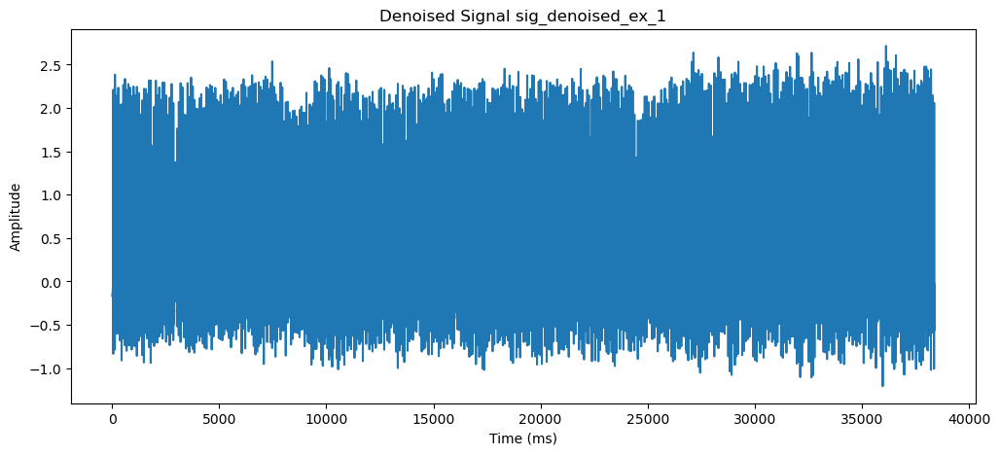

In [128]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_1)
plt.title('Denoised Signal sig_denoised_ex_1')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

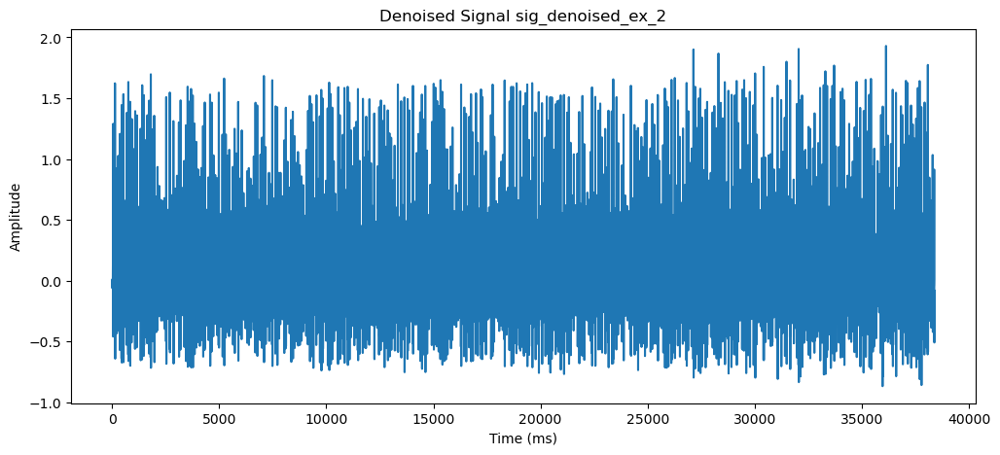

In [129]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_2)
plt.title('Denoised Signal sig_denoised_ex_2')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

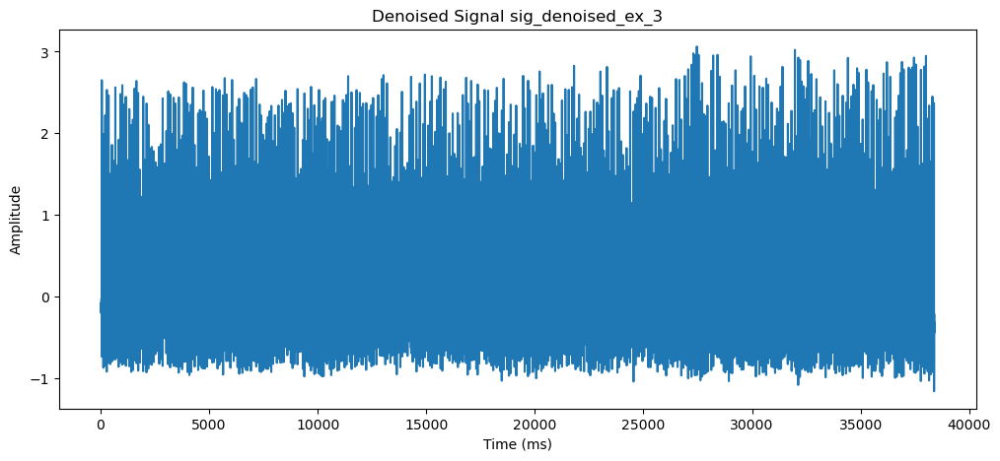

In [130]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_3)
plt.title('Denoised Signal sig_denoised_ex_3')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

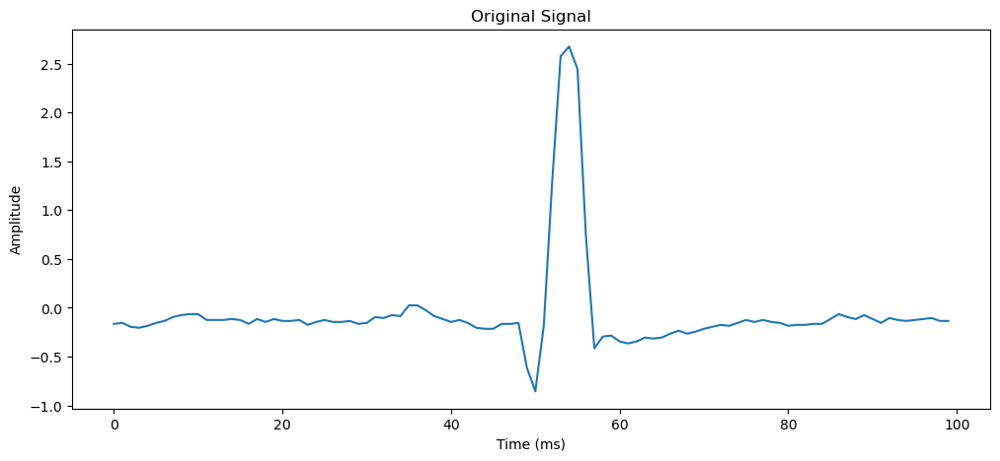

In [131]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(segments[0][:100])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

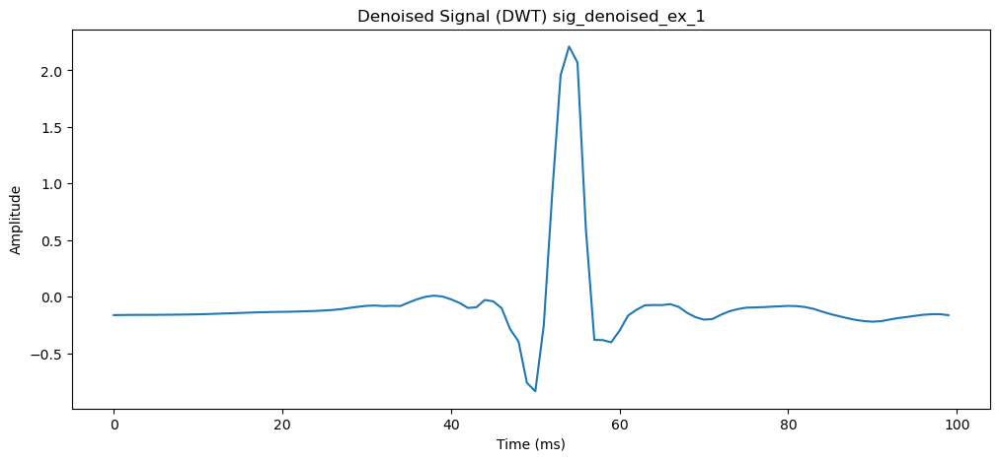

In [132]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_1[:100])
plt.title('Denoised Signal (DWT) sig_denoised_ex_1')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

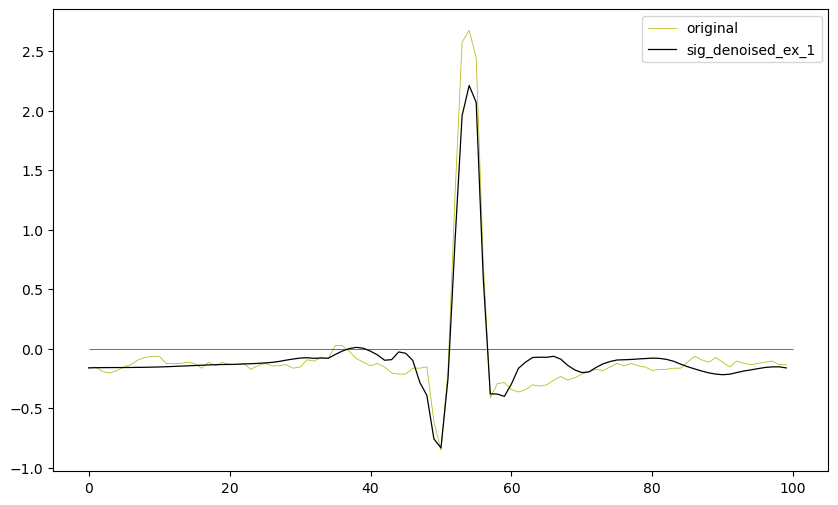

In [133]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][:100], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_1[0:100], color='black', linewidth=0.9,label = 'sig_denoised_ex_1')
plt.hlines(0,0,100,color='black', linewidth=0.4)
plt.legend()
plt.show()

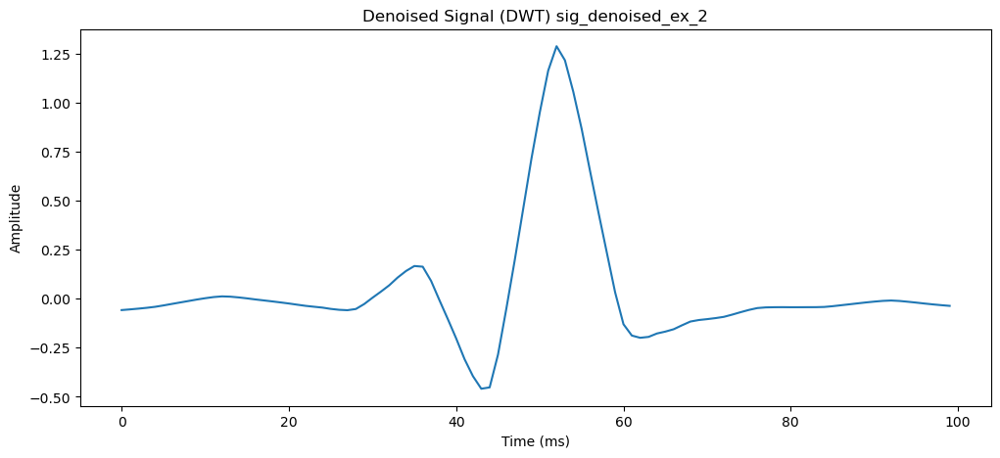

In [134]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_2[:100])
plt.title('Denoised Signal (DWT) sig_denoised_ex_2')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

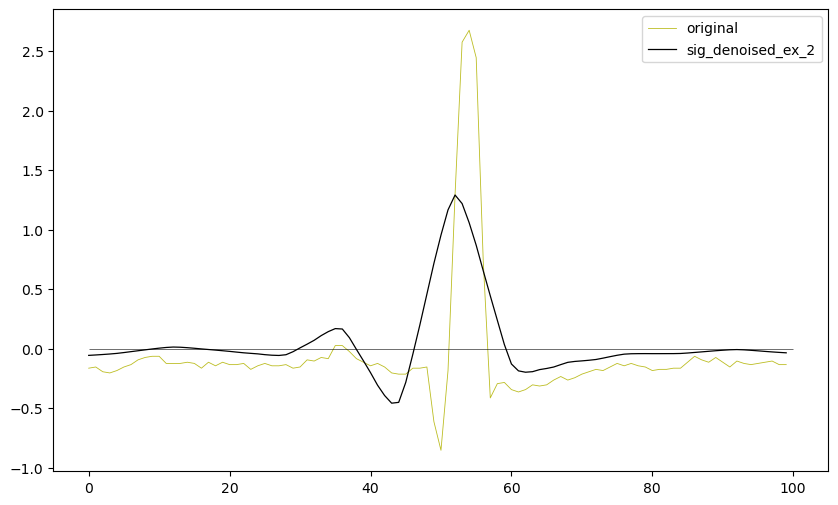

In [135]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][:100], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_2[0:100], color='black', linewidth=0.9,label = 'sig_denoised_ex_2')
plt.hlines(0,0,100,color='black', linewidth=0.4)
plt.legend()
plt.show()

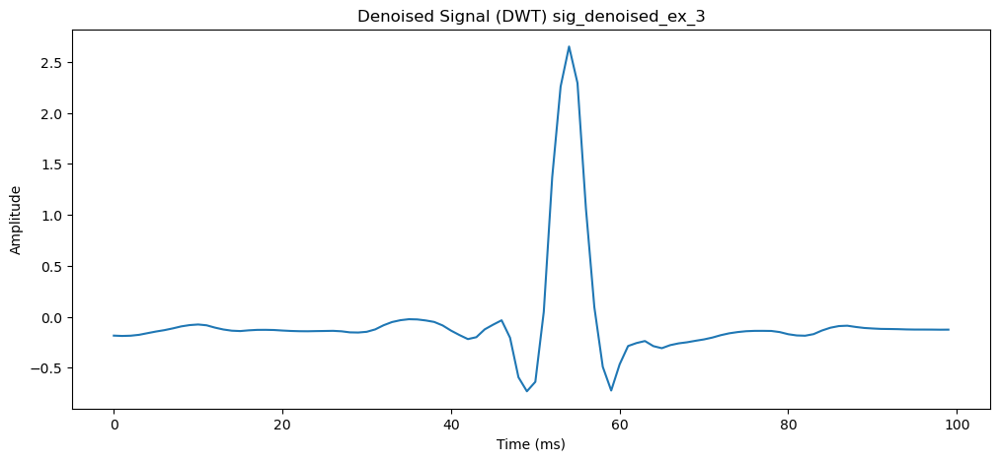

In [136]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_3[:100])
plt.title('Denoised Signal (DWT) sig_denoised_ex_3')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

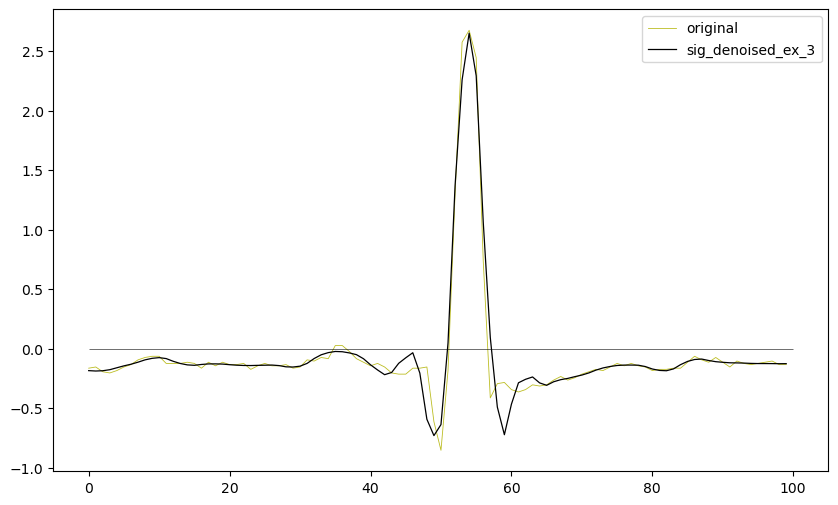

In [137]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][:100], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_3[0:100], color='black', linewidth=0.9,label = 'sig_denoised_ex_3')
plt.hlines(0,0,100,color='black', linewidth=0.4)
plt.legend()
plt.show()

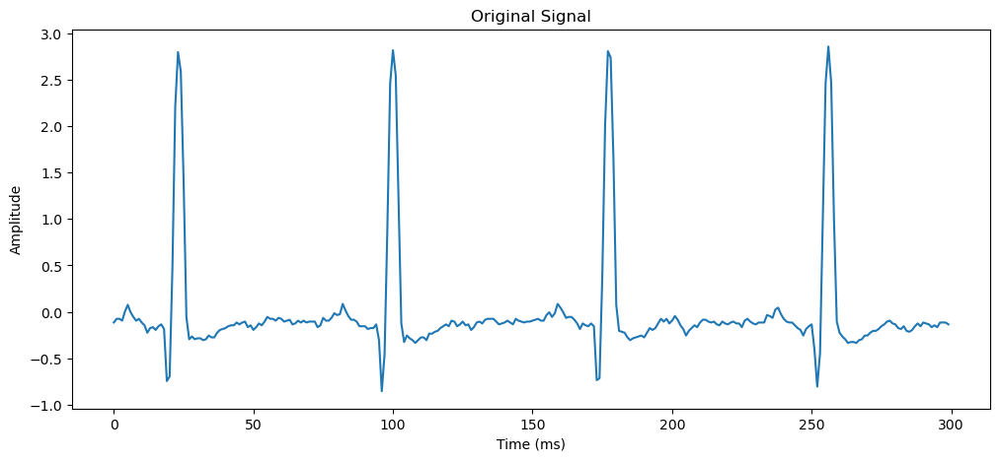

In [138]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(segments[0][500:800])
plt.title('Original Signal')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

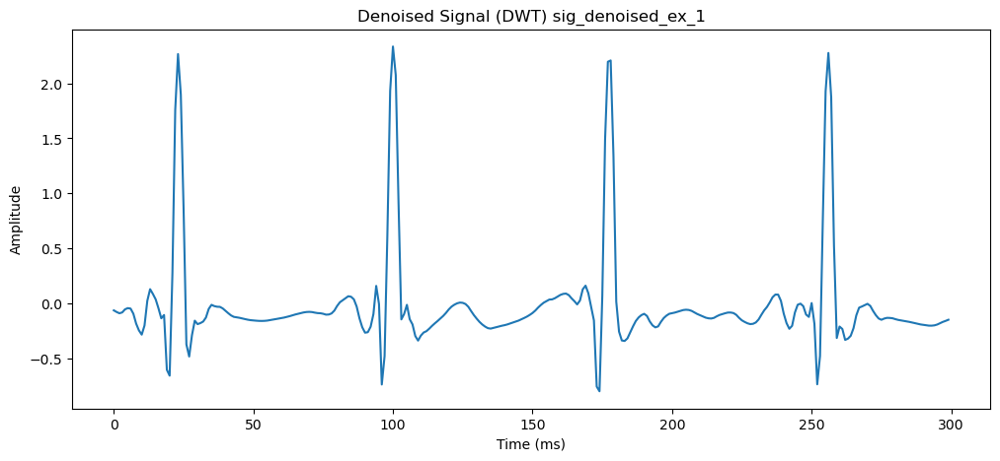

In [139]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_1[500:800])
plt.title('Denoised Signal (DWT) sig_denoised_ex_1')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

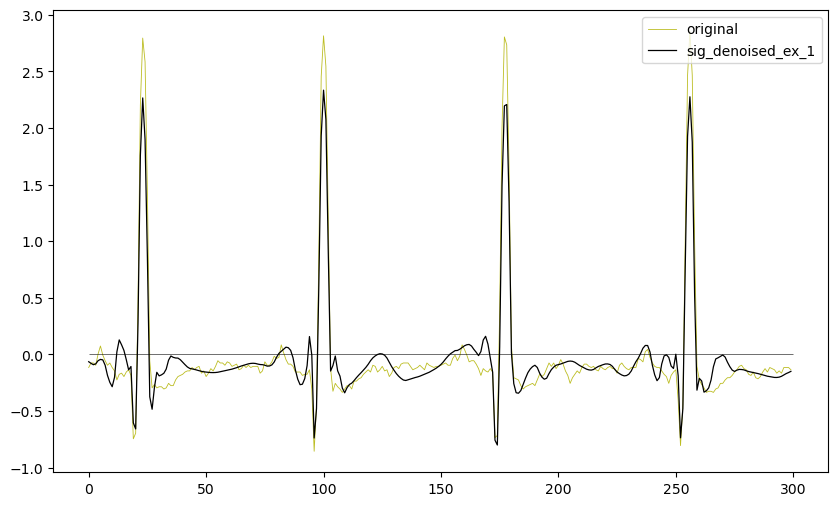

In [140]:
plt.figure(figsize=(10,6))

plt.plot(segments[0][500:800], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_1[500:800], color='black', linewidth=0.9,label = 'sig_denoised_ex_1')
plt.hlines(0,0,300,color='black', linewidth=0.4)
plt.legend()
plt.show()

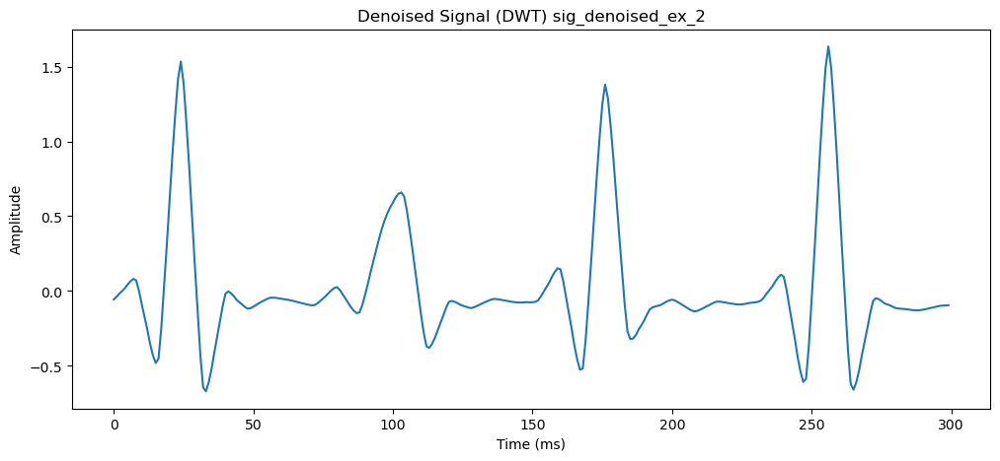

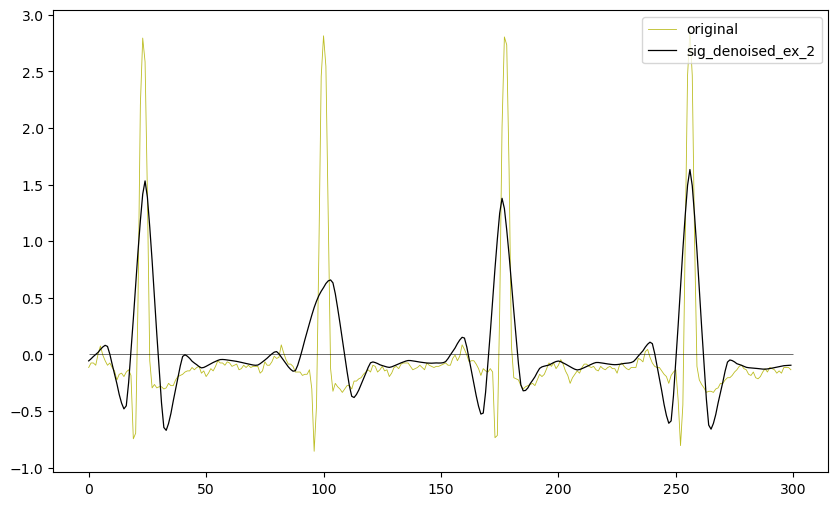

In [141]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_2[500:800])
plt.title('Denoised Signal (DWT) sig_denoised_ex_2')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

plt.figure(figsize=(10,6))

plt.plot(segments[0][500:800], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_2[500:800], color='black', linewidth=0.9,label = 'sig_denoised_ex_2')
plt.hlines(0,0,300,color='black', linewidth=0.4)
plt.legend()
plt.show()

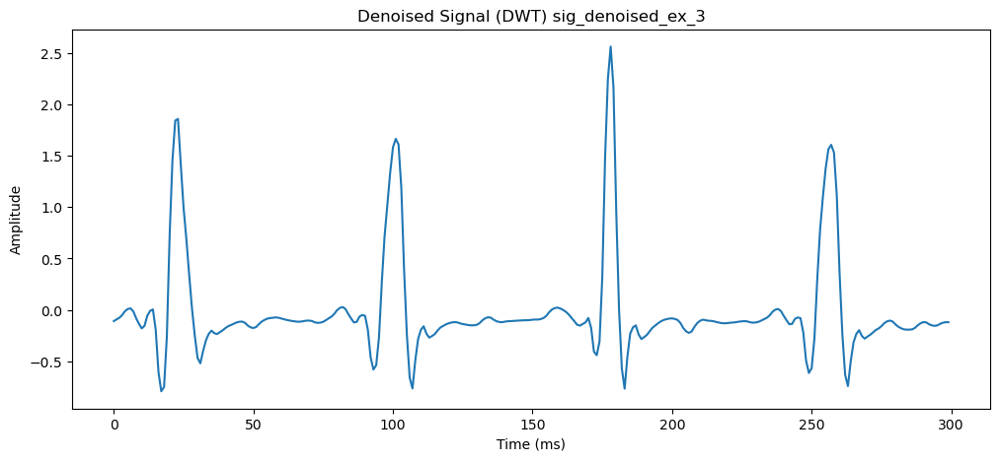

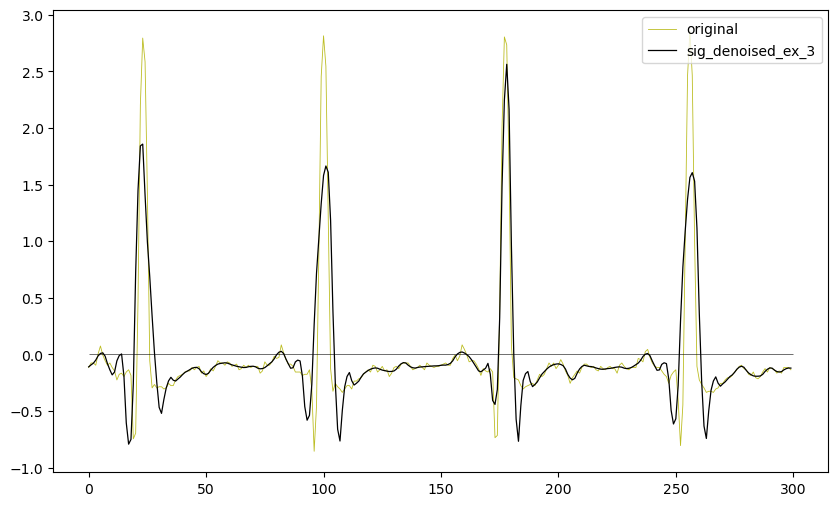

In [142]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_3[500:800])
plt.title('Denoised Signal (DWT) sig_denoised_ex_3')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

plt.figure(figsize=(10,6))

plt.plot(segments[0][500:800], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_3[500:800], color='black', linewidth=0.9,label = 'sig_denoised_ex_3')
plt.hlines(0,0,300,color='black', linewidth=0.4)
plt.legend()
plt.show()

In [143]:
sig_denoised_ex_4 = denoise_signal_2(segments[0],'sym9', 8 , 0 , 7) # 8 level fine (8, 0, 7)

In [144]:
sig_denoised_ex_4

array([-0.18605844, -0.1877863 , -0.18450449, ..., -0.27571151,
       -0.23513208, -0.21539898])

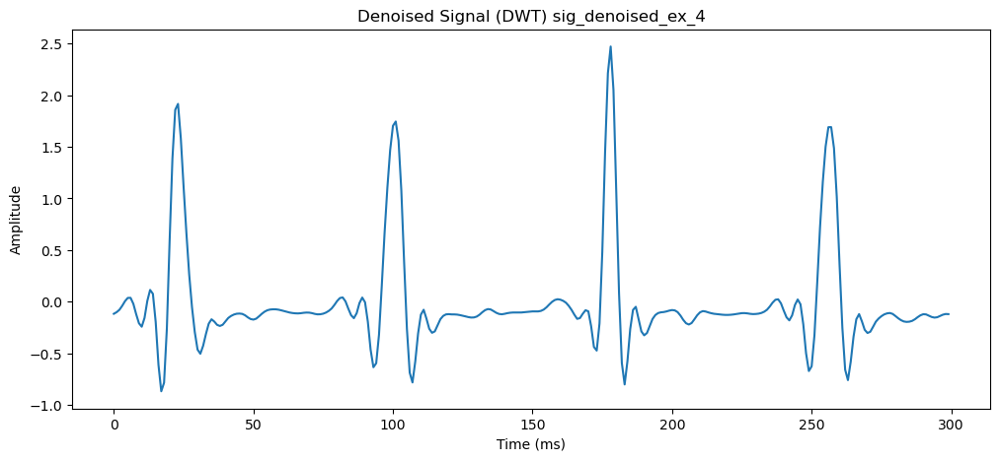

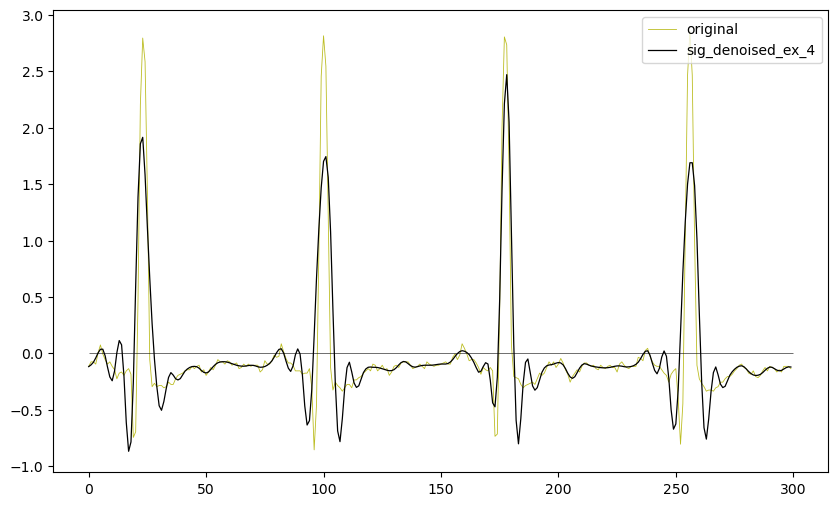

In [145]:
plt.figure(figsize=(12, 5))
plt.subplot()
plt.plot(sig_denoised_ex_4[500:800])
plt.title('Denoised Signal (DWT) sig_denoised_ex_4')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.show()

plt.figure(figsize=(10,6))

plt.plot(segments[0][500:800], color='tab:olive', linewidth=0.6,label = 'original')
plt.plot(sig_denoised_ex_4[500:800], color='black', linewidth=0.9,label = 'sig_denoised_ex_4')
plt.hlines(0,0,300,color='black', linewidth=0.4)
plt.legend()
plt.show()

# Remove Baseline Wander

In [146]:
def get_median_filter_width(sampling_rate, duration):
    res = int( sampling_rate*duration )
    res += ((res%2) - 1) # needs to be an odd number
    return res

In [147]:
# baseline fitting by filtering
# === Define Filtering Params for Baseline fitting Leads======================

BASIC_SRATE = 128
ms_flt_array = [0.2,0.6]    #<-- length of baseline fitting filters (in seconds)
mfa = np.zeros(len(ms_flt_array), dtype='int')
for i in range(0, len(ms_flt_array)):
    mfa[i] = get_median_filter_width(BASIC_SRATE,ms_flt_array[i])

In [148]:
mfa

array([25, 75])

In [149]:
from scipy.signal import medfilt

def filter_signal(X):
    global mfa
    X0 = X  #read orignal signal
    for mi in range(0,len(mfa)):
        X0 = medfilt(X0,mfa[mi]) # apply median filter one by one on top of each other
    X0 = np.subtract(X,X0)  # finally subtract from orignal signal
    return X0

In [150]:
signal_flt_ex_1 = filter_signal(sig_denoised_ex_1)
signal_flt_ex_1.shape

(38400,)

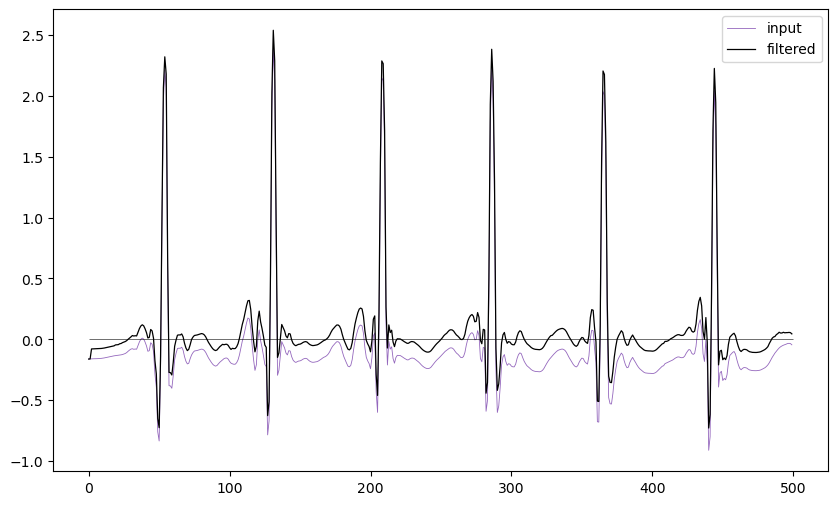

In [151]:
plt.figure(figsize=(10,6))

plt.plot(sig_denoised_ex_1[:500], color='tab:purple', linewidth=0.6,label = 'input')
plt.plot(signal_flt_ex_1[:500], color='black', linewidth=0.9,label = 'filtered')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

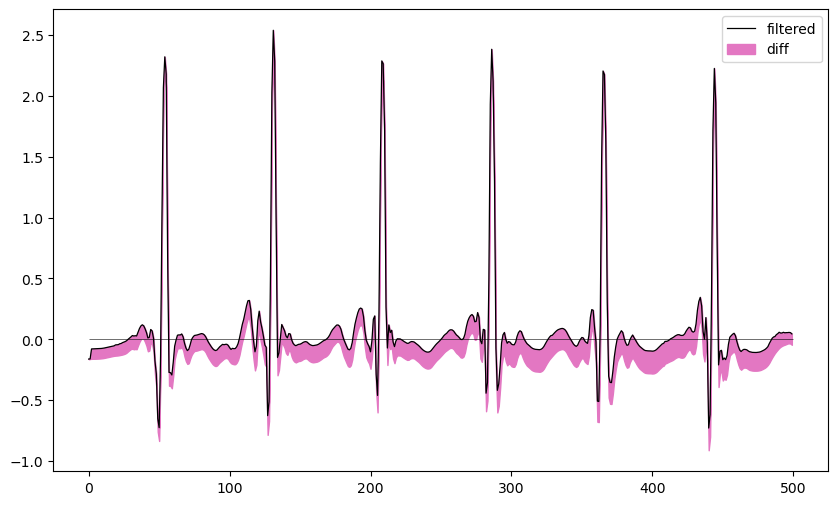

In [152]:
plt.figure(figsize=(10,6))
plt.plot(signal_flt_ex_1[:500], color='black', linewidth=0.9,label = 'filtered')
plt.fill_between(np.arange(0,500,1),sig_denoised_ex_1[:500],signal_flt_ex_1[:500],color='tab:pink',label = 'diff')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

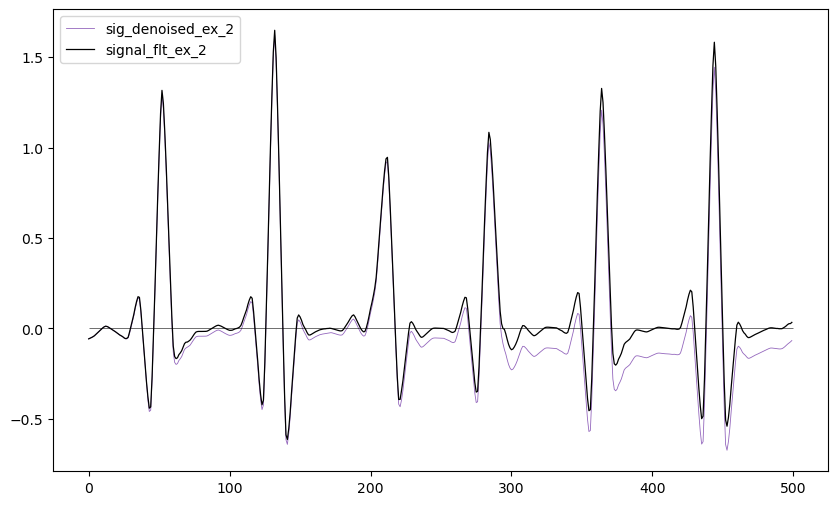

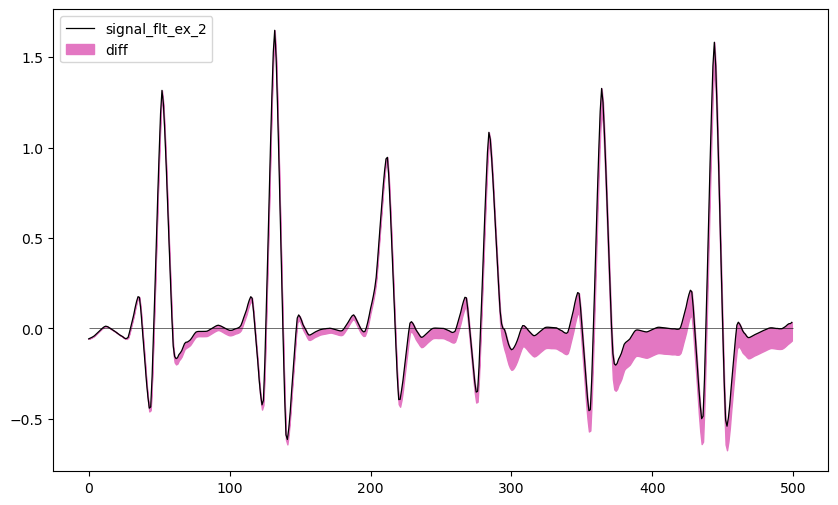

In [153]:
signal_flt_ex_2 = filter_signal(sig_denoised_ex_2)

plt.figure(figsize=(10,6))

plt.plot(sig_denoised_ex_2[:500], color='tab:purple', linewidth=0.6,label = 'sig_denoised_ex_2')
plt.plot(signal_flt_ex_2[:500], color='black', linewidth=0.9,label = 'signal_flt_ex_2')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.plot(signal_flt_ex_2[:500], color='black', linewidth=0.9,label = 'signal_flt_ex_2')
plt.fill_between(np.arange(0,500,1),sig_denoised_ex_2[:500],signal_flt_ex_2[:500],color='tab:pink',label = 'diff')
plt.hlines(0,0,500,color='black', linewidth=0.4)
plt.legend()
plt.show()

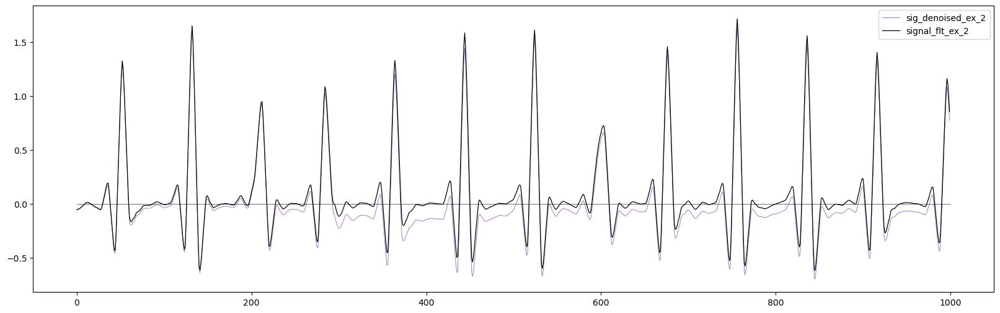

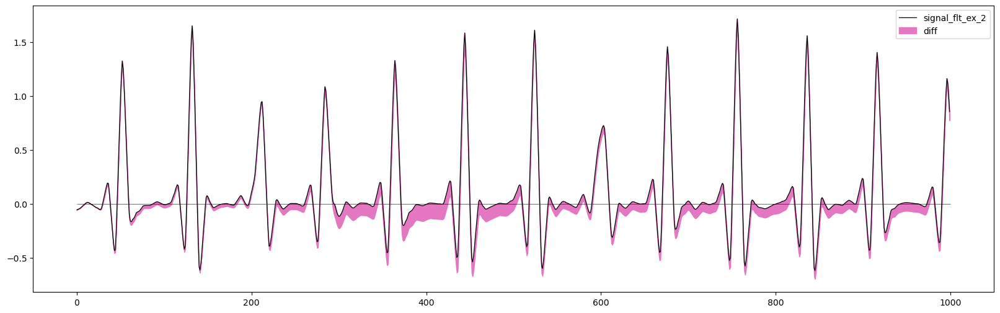

In [154]:
signal_flt_ex_2 = filter_signal(sig_denoised_ex_2)

plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_2[:1000], color='tab:purple', linewidth=0.6,label = 'sig_denoised_ex_2')
plt.plot(signal_flt_ex_2[:1000], color='black', linewidth=0.9,label = 'signal_flt_ex_2')
plt.hlines(0,0,1000,color='black', linewidth=0.4)
plt.legend()
plt.show()

plt.figure(figsize=(20,6))
plt.plot(signal_flt_ex_2[:1000], color='black', linewidth=0.9,label = 'signal_flt_ex_2')
plt.fill_between(np.arange(0,1000,1),sig_denoised_ex_2[:1000],signal_flt_ex_2[:1000],color='tab:pink',label = 'diff')
plt.hlines(0,0,1000,color='black', linewidth=0.4)
plt.legend()
plt.show()

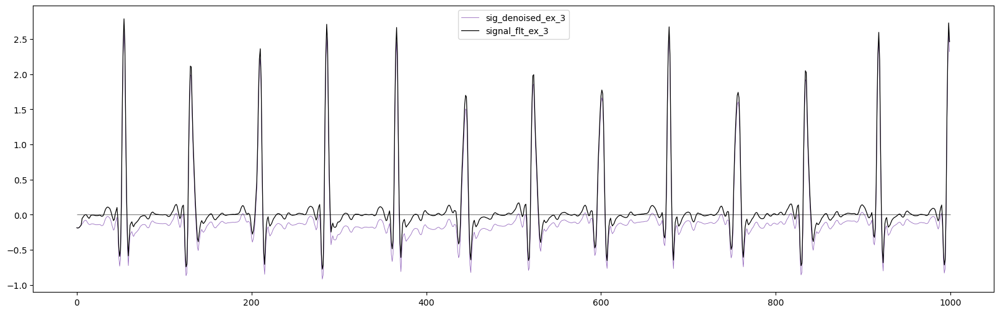

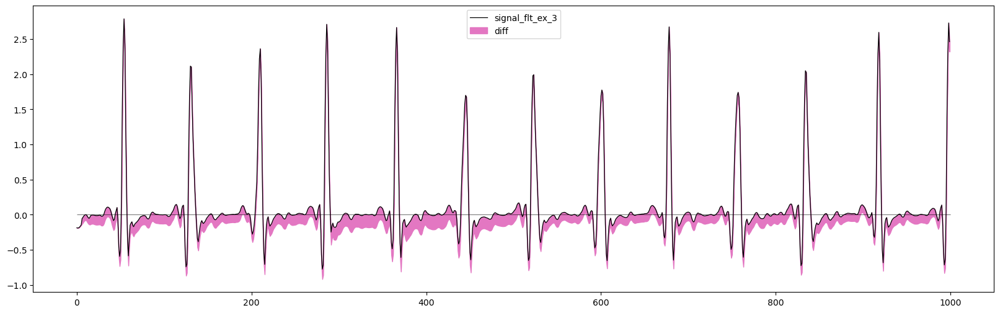

In [155]:
signal_flt_ex_3 = filter_signal(sig_denoised_ex_3)

plt.figure(figsize=(20,6))

plt.plot(sig_denoised_ex_3[:1000], color='tab:purple', linewidth=0.6,label = 'sig_denoised_ex_3')
plt.plot(signal_flt_ex_3[:1000], color='black', linewidth=0.9,label = 'signal_flt_ex_3')
plt.hlines(0,0,1000,color='black', linewidth=0.4)
plt.legend()
plt.show()

plt.figure(figsize=(20,6))
plt.plot(signal_flt_ex_3[:1000], color='black', linewidth=0.9,label = 'signal_flt_ex_3')
plt.fill_between(np.arange(0,1000,1),sig_denoised_ex_3[:1000],signal_flt_ex_3[:1000],color='tab:pink',label = 'diff')
plt.hlines(0,0,1000,color='black', linewidth=0.4)
plt.legend()
plt.show()

# R peak detection

In [166]:
from ecgdetectors import Detectors
detectors = Detectors(BASIC_SRATE)

In [167]:
detectors

In [168]:
signal_pad_samples = 10
signal_pad = np.zeros(signal_pad_samples) # pad one sec to detect initial peaks properly
signalf_ex_3 = signal_flt_ex_3
detectors = Detectors(BASIC_SRATE)

In [169]:
detectors.__dict__

{'fs': 128,
 'engzee_fake_delay': 0,
 'detector_list': [['Elgendi et al (Two average)',
   <bound method Detectors.two_average_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['Matched filter',
   <bound method Detectors.matched_filter_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['Kalidas & Tamil (Wavelet transform)',
   <bound method Detectors.swt_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['Engzee',
   <bound method Detectors.engzee_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['Christov',
   <bound method Detectors.christov_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['Hamilton',
   <bound method Detectors.hamilton_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['Pan Tompkins',
   <bound method Detectors.pan_tompkins_detector of <ecgdetectors.Detectors object at 0x000001BEC07AB440>>],
  ['WQRS',
   <bound method Detectors.wqrs_det

In [170]:
detectors = {
            'pan_tompkins_detector':[detectors.pan_tompkins_detector, []],
            'hamilton_detector':[detectors.hamilton_detector, []],
            'christov_detector':[detectors.christov_detector, []],
            'engzee_detector':[detectors.engzee_detector, []],
            'swt_detector':[detectors.swt_detector, []],
            'two_average_detector':[detectors.two_average_detector, []],
            }

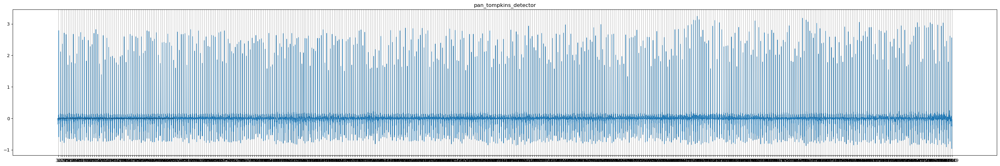

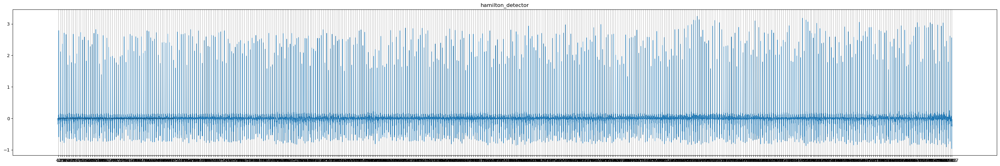

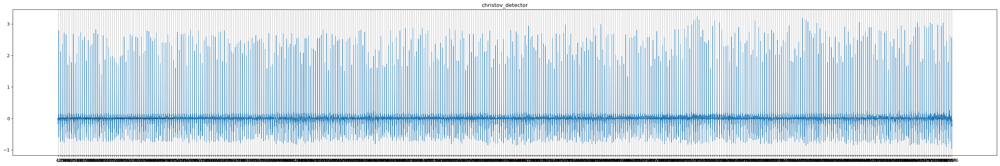

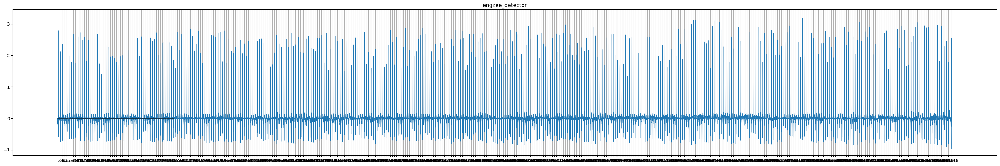

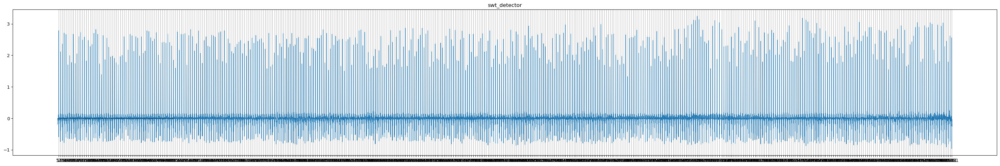

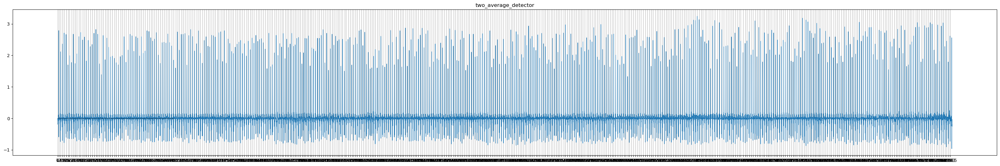

In [171]:
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_3)))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_3,color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,5000,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

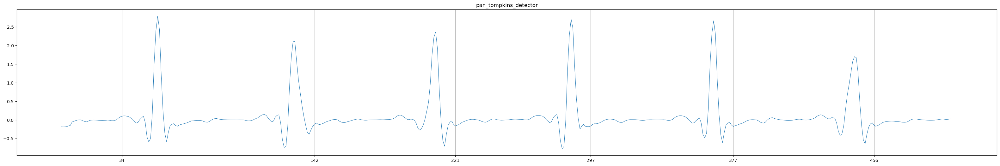

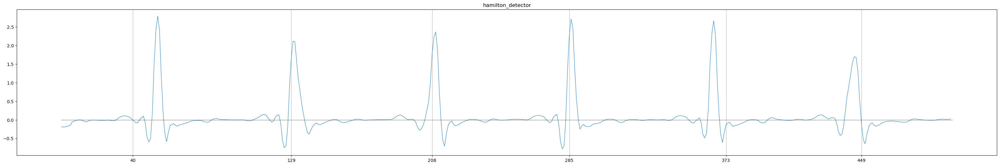

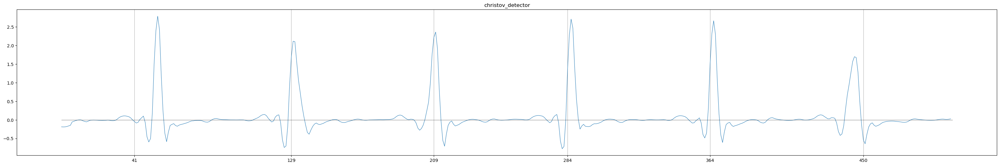

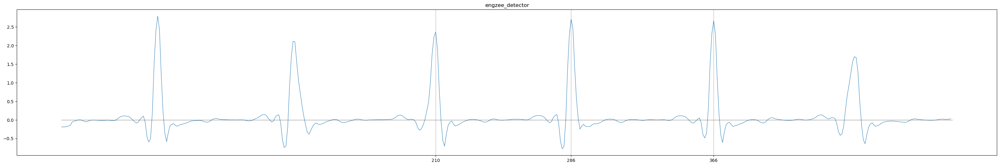

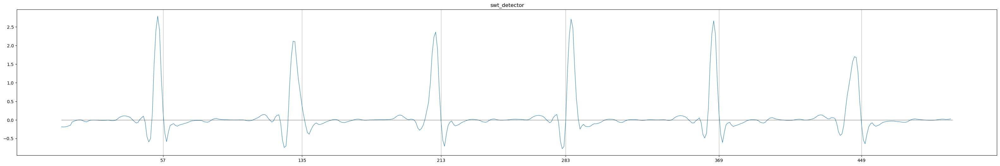

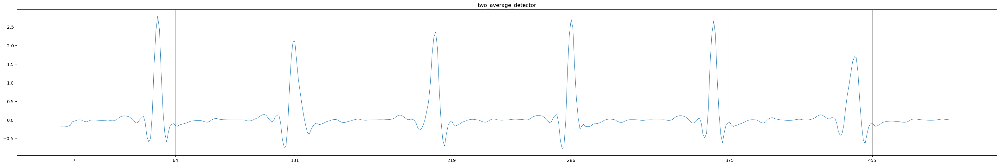

In [172]:
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_3[:500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_3[:500],color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

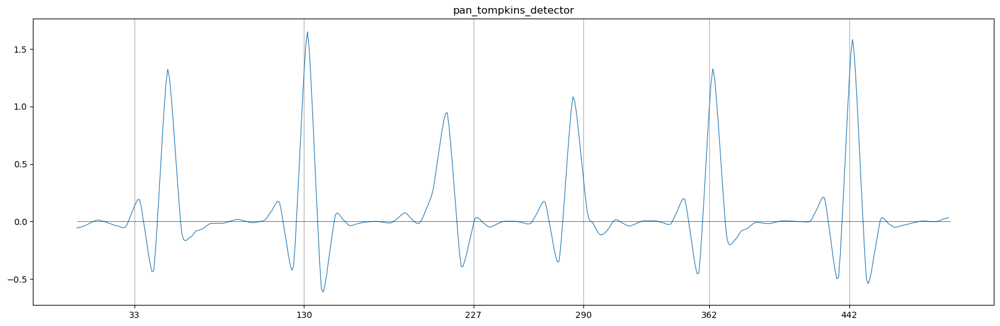

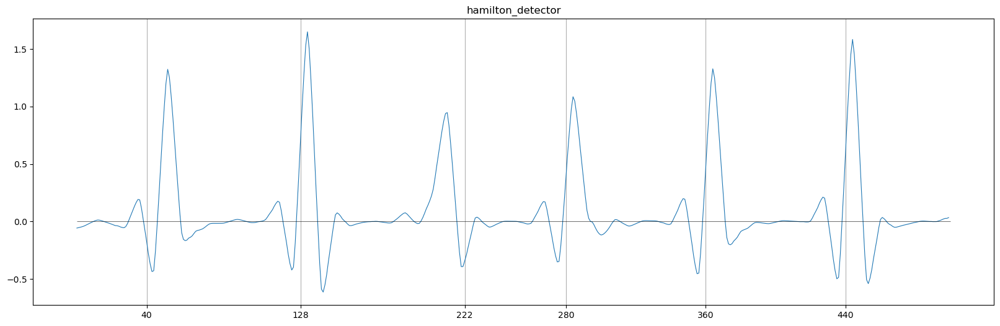

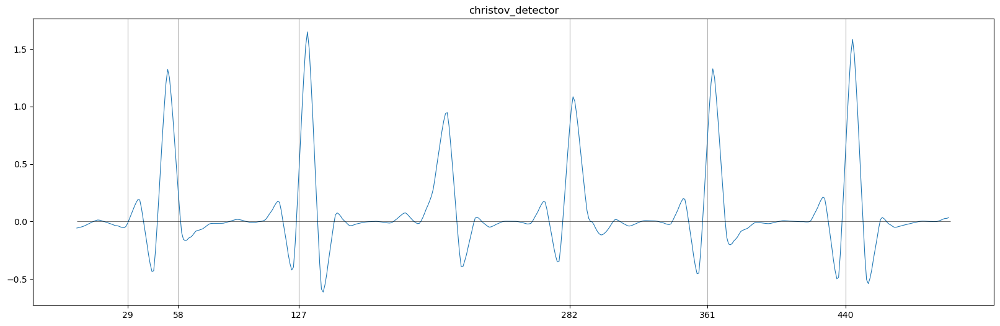

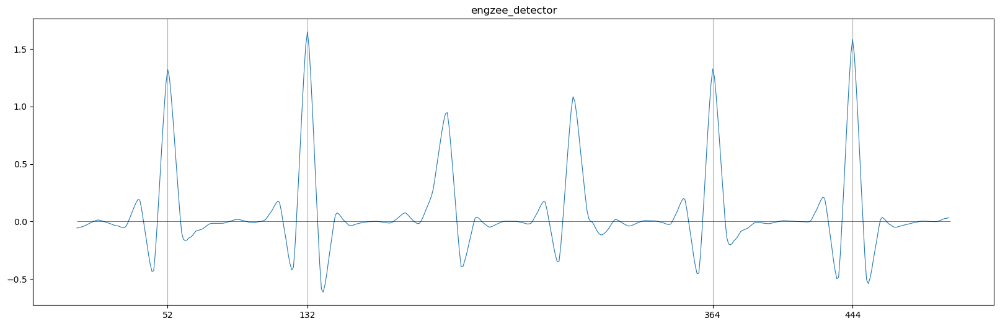

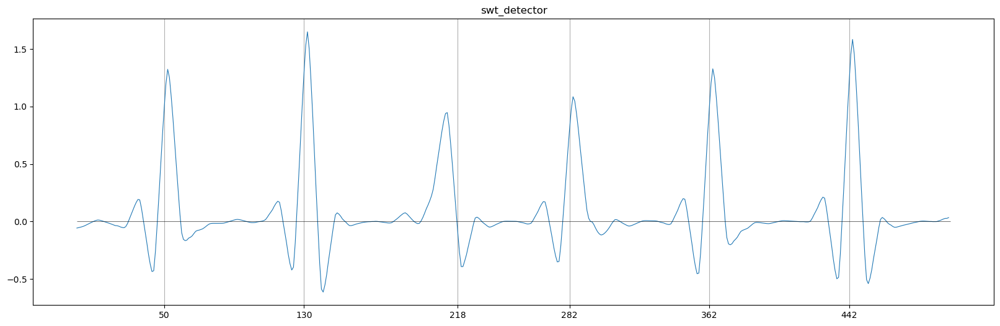

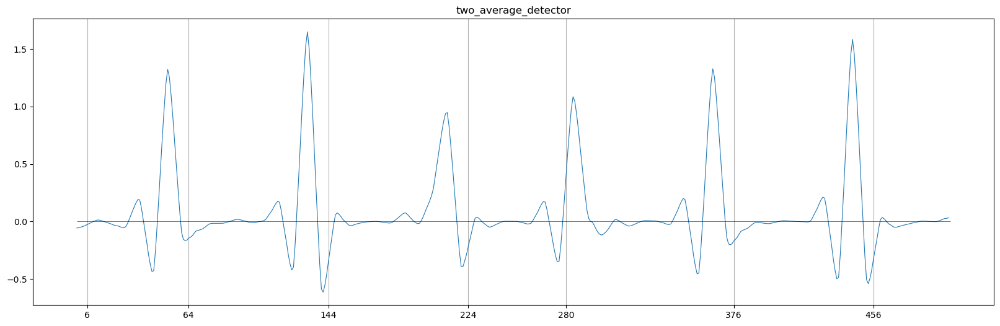

In [173]:
signalf_ex_2 = signal_flt_ex_2

for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_2[:500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(20,6))
    plt.title(kd)
    plt.plot(signalf_ex_2[:500],color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

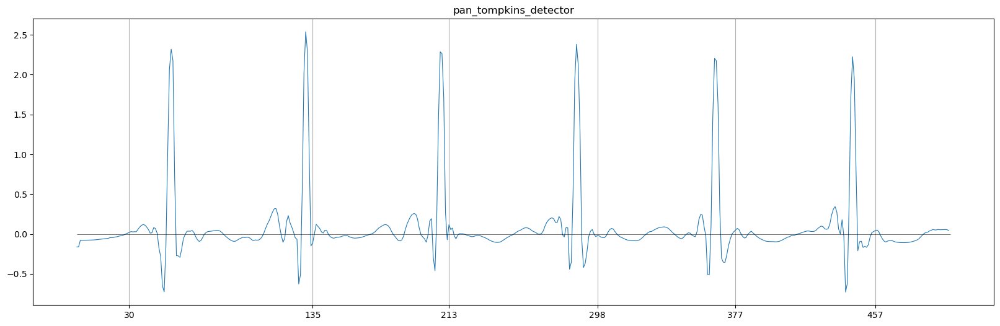

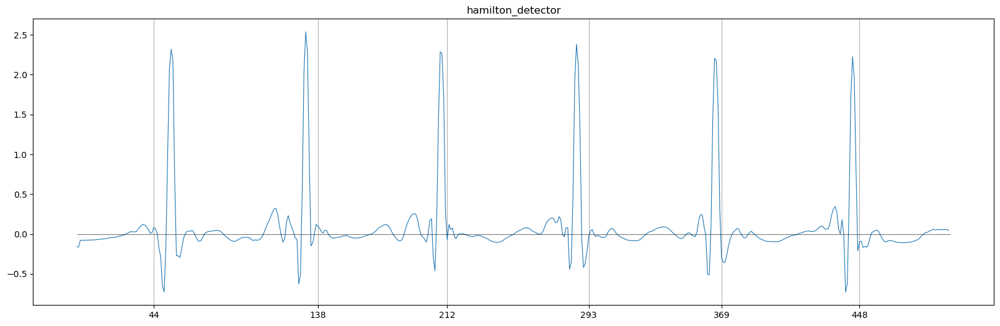

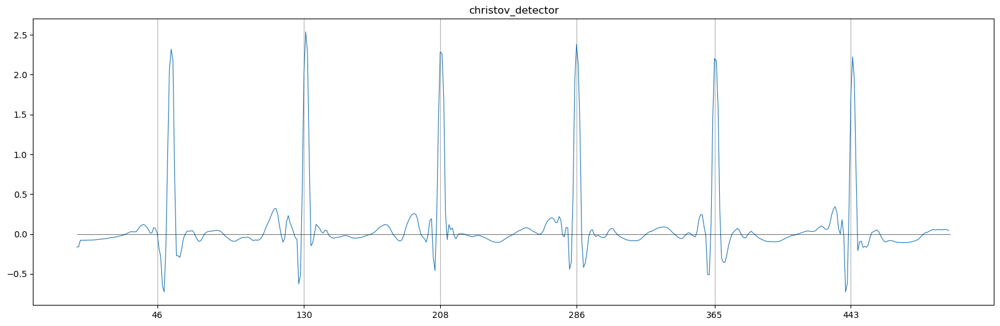

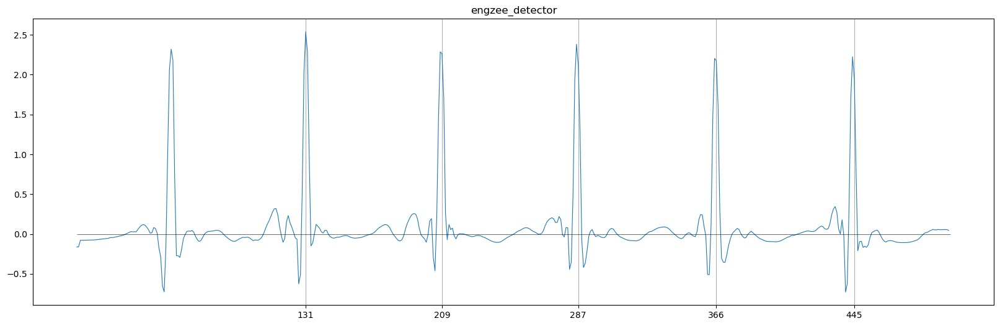

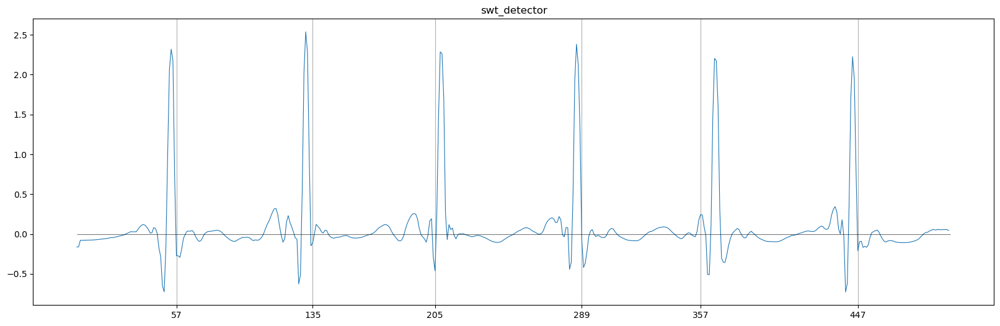

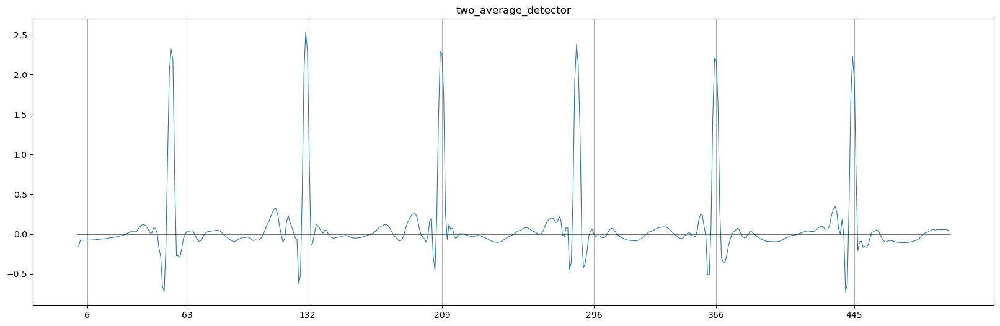

In [174]:
signalf_ex_1 = signal_flt_ex_1

for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_1[:500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(20,6))
    plt.title(kd)
    plt.plot(signalf_ex_1[:500],color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

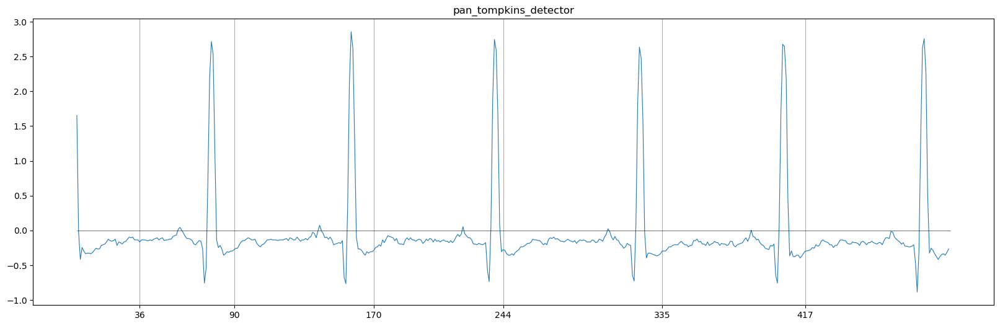

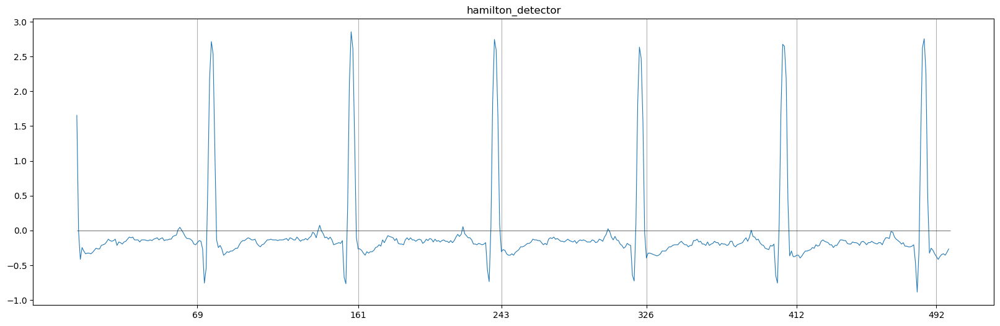

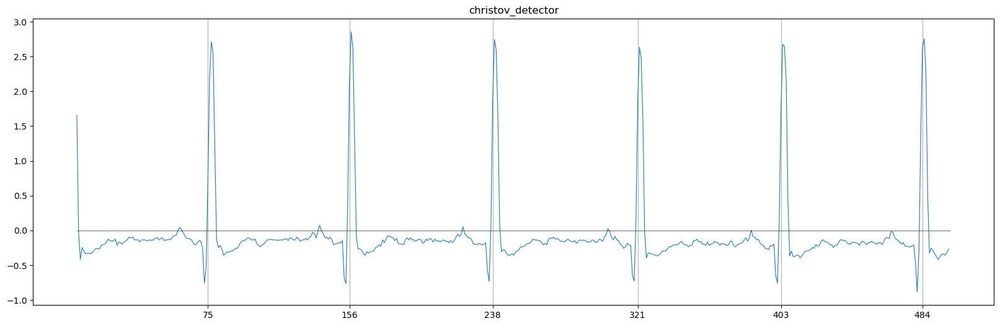

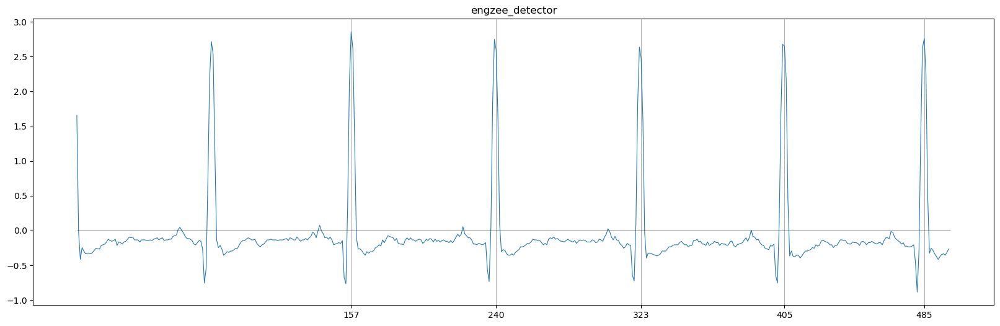

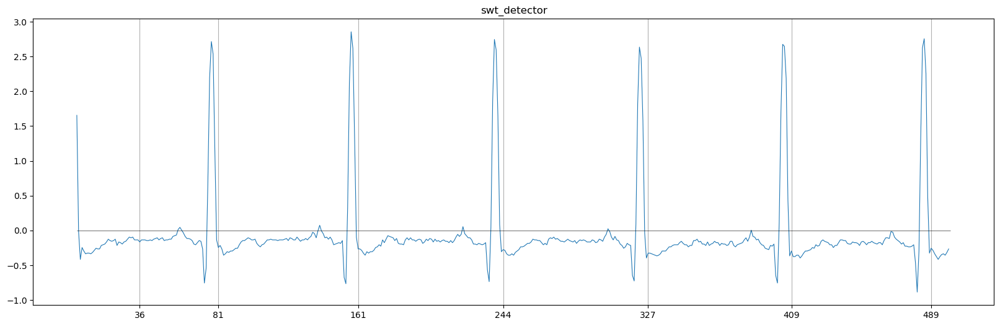

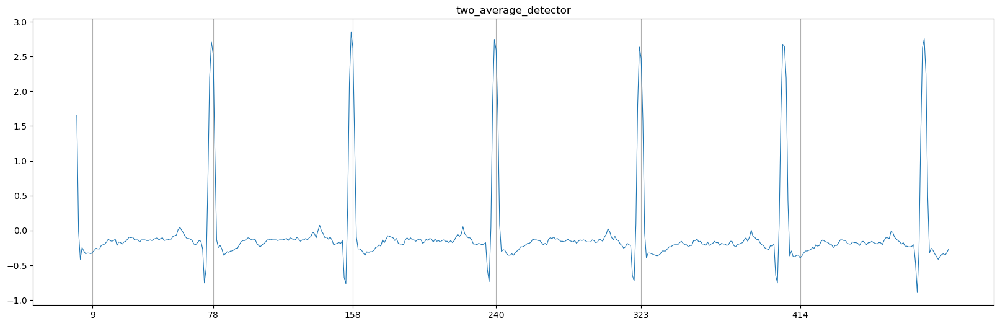

In [179]:
signalf_ex_0 = segments[0]

for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,segments[0][1000:1500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(20,6))
    plt.title(kd)
    plt.plot(signalf_ex_0[1000:1500],color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

In [180]:
print(detectors.keys())

dict_keys(['pan_tompkins_detector', 'hamilton_detector', 'christov_detector', 'engzee_detector', 'swt_detector', 'two_average_detector'])


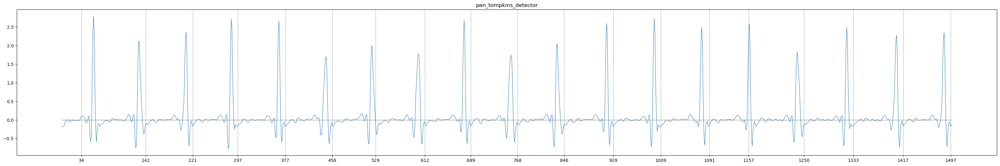

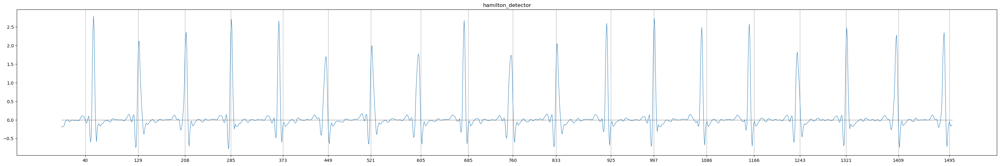

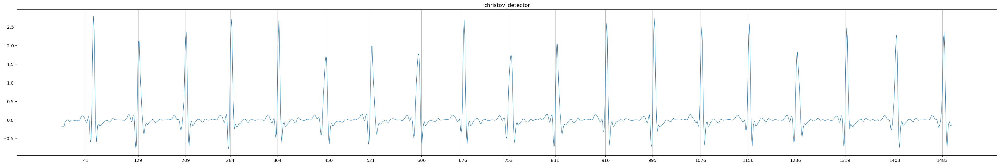

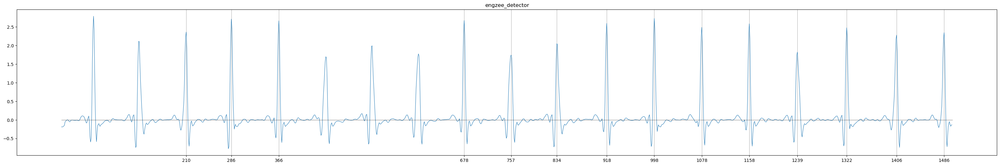

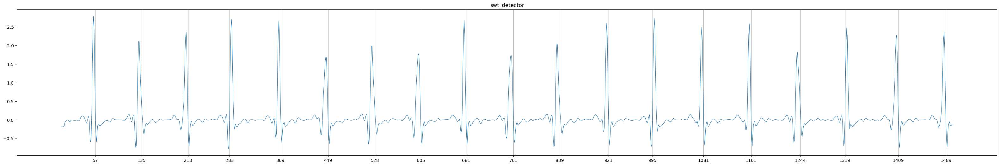

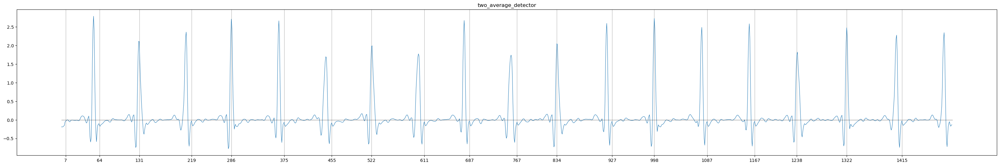

In [182]:
signalf_ex_3 = signal_flt_ex_3
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_3[:1500])))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_3[:1500],color='tab:blue',linewidth=0.8)
    plt.hlines(0,0,1500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

In [183]:
detectors['christov_detector'][1]

array([  41,  129,  209,  284,  364,  450,  521,  606,  676,  753,  831,
        916,  995, 1076, 1156, 1236, 1319, 1403, 1483])

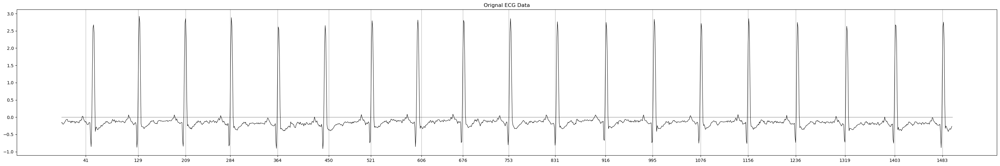

In [184]:
data_signal = signalf_ex_3
data_peaks = detectors['christov_detector'][1]

plt.figure(figsize=(40,6))
plt.title('Orignal ECG Data')
plt.plot(segments[0][:1500],color='black',linewidth=0.8)
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.xticks(data_peaks)
plt.grid(axis='x')
plt.show()

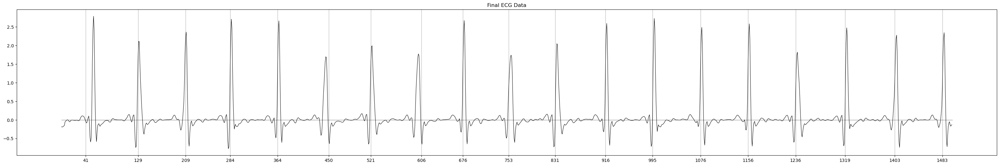

In [185]:
plt.figure(figsize=(40,6))
plt.title('Final ECG Data')
plt.plot(data_signal[:1500],color='black',linewidth=0.8)
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.xticks(data_peaks)
plt.grid(axis='x')
plt.show()

# Naddev

In [186]:
def nadev(signal):
    median_x = np.median(signal)
    mad = np.median(np.abs(signal - median_x))
    return (signal - median_x) / mad if mad != 0 else signal

In [187]:
nadev_ex_1 = nadev(signal_flt_ex_3)

In [188]:
nadev_ex_1

array([-4.28786634, -4.3621355 , -4.30688553, ..., -1.66822194,
       -0.86517096, -0.80346936])

In [189]:
signal_flt_ex_3

array([-0.18560928, -0.18882417, -0.18643256, ..., -0.07221248,
       -0.03745074, -0.03477985])

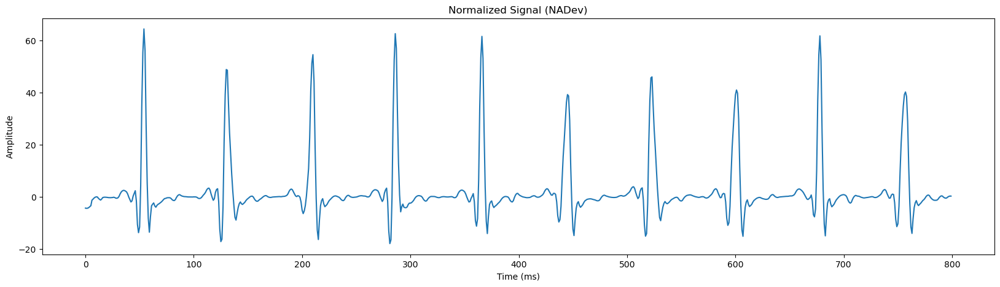

In [191]:
# Plot Normalized Signals
plt.figure(figsize=(20, 5))
plt.plot(nadev_ex_1[:800])
plt.title('Normalized Signal (NADev)')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

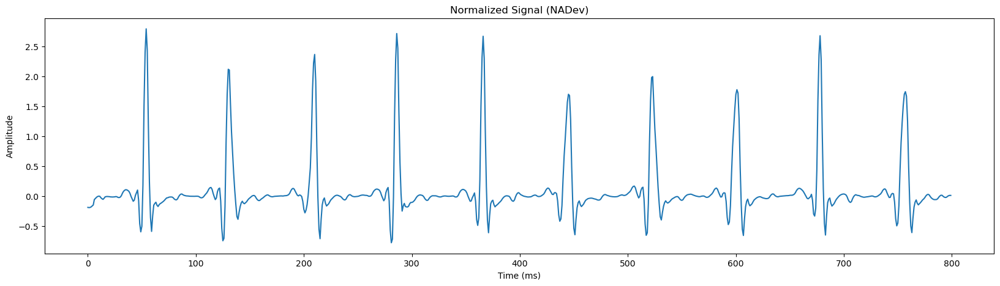

In [192]:
# Plot Normalized Signals
plt.figure(figsize=(20, 5))
plt.plot(signal_flt_ex_3[:800])
plt.title('Normalized Signal (NADev)')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')

plt.show()

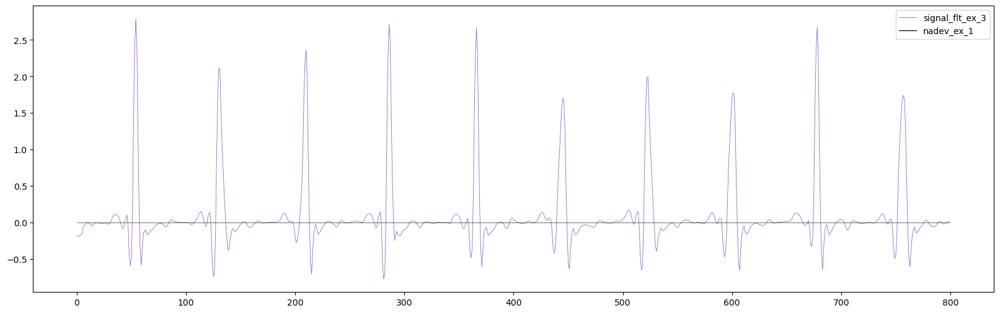

In [194]:
plt.figure(figsize=(20,6))

plt.plot(signal_flt_ex_3[:800], color='tab:purple', linewidth=0.6,label = 'signal_flt_ex_3')
plt.plot(nadev_ex_1[:000], color='black', linewidth=0.9,label = 'nadev_ex_1')
plt.hlines(0,0,800,color='black', linewidth=0.4)
plt.legend()
plt.show()

# Ex prev

In [195]:
from scipy.signal import find_peaks, butter, filtfilt

# Bandpass filter to remove baseline wander and high-frequency noise
def bandpass_filter(signal, lowcut=0.5, highcut=50, fs=360, order=2):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, signal)

# Detect R-peaks using thresholding and peak detection
def detect_r_peaks(signal, fs=360):
    filtered_signal = bandpass_filter(signal, 0.5, 50, fs)

    # Differentiation to highlight slopes
    diff_signal = np.diff(filtered_signal, prepend=filtered_signal[0])

    # Squaring to emphasize peaks
    squared_signal = diff_signal ** 2

    # Moving window integration (window ~150ms)
    window_size = int(0.15 * fs)
    integrated_signal = np.convolve(squared_signal, np.ones(window_size) / window_size, mode='same')

    # Detect peaks
    peaks, _ = find_peaks(integrated_signal, height=np.mean(integrated_signal) * 1.2, distance=fs//2)
    return peaks

In [196]:
# Apply R-peak detection to a normalized segment
r_peaks = detect_r_peaks(signal_flt_ex_3)

In [197]:
r_peaks

array([   59,   290,   683,  1003,  1327,  1650,  1967,  2203,  2859,
        3118,  3363,  3605,  3844,  4065,  4246,  4491,  4738,  4918,
        5151,  5464,  5716,  6058,  6379,  6619,  6930,  7166,  7402,
        7688,  7868,  8195,  8518,  8758,  9075,  9391,  9694, 10064,
       10351, 10776, 10982, 11163, 11403, 11792, 12018, 12239, 12553,
       12769, 12951, 13190, 13648, 13871, 14303, 14693, 14939, 15255,
       15651, 15898, 16219, 16439, 16838, 17071, 17370, 17662, 17850,
       18067, 18247, 18560, 18888, 19141, 19462, 19690, 19920, 20224,
       20610, 20793, 21407, 21807, 22038, 22334, 22714, 23022, 23328,
       23635, 23879, 24387, 24689, 24870, 25115, 25306, 25725, 26044,
       26495, 26677, 26888, 27073, 27460, 27700, 27948, 28212, 28411,
       28773, 29061, 29241, 29493, 29685, 29941, 30346, 30658, 30907,
       31154, 31406, 31654, 31976, 32215, 32591, 32783, 32967, 33148,
       33384, 33791, 34183, 34418, 34653, 34841, 35099, 35350, 35586,
       35905, 36214,

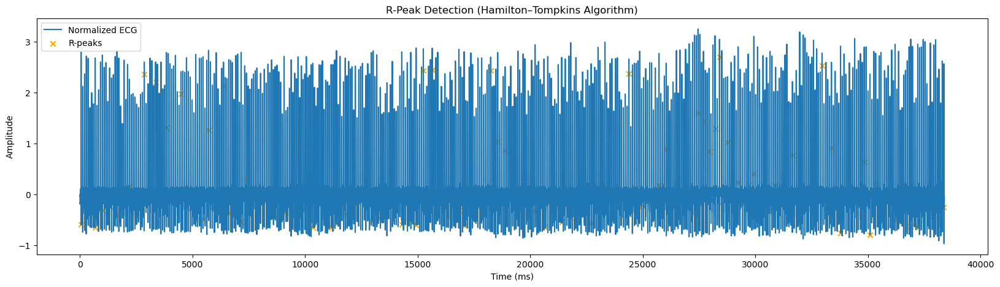

In [198]:
# Plot the R-peaks on the ECG signal
plt.figure(figsize=(20, 5))
plt.plot(signal_flt_ex_3, label='Normalized ECG')
plt.scatter(r_peaks, signal_flt_ex_3[r_peaks], color='orange', marker='x', label='R-peaks')
plt.title('R-Peak Detection (Hamilton–Tompkins Algorithm)')
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

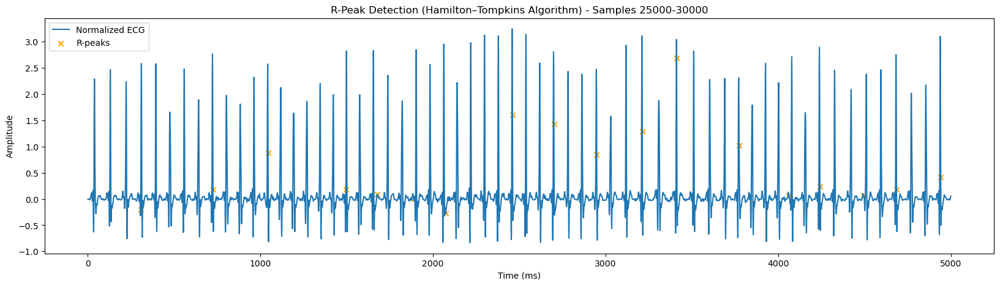

In [199]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 5))

# Select the portion between samples 25000 and 30000 for plotting
plt.plot(signal_flt_ex_3[25000:30000], label='Normalized ECG')

# Adjust R-peak scatter plot for the selected range
r_peaks_within_range = [r for r in r_peaks if 25000 <= r < 30000]
# Filter R-peaks within the range

# Adjust x-coordinates for scatter plot
x_coords_for_scatter = [x - 25000 for x in r_peaks_within_range]
# Shift x-coordinates

plt.scatter(x_coords_for_scatter, signal_flt_ex_3[r_peaks_within_range],
            color='orange', marker='x', label='R-peaks')

plt.title('R-Peak Detection (Hamilton–Tompkins Algorithm) - Samples 25000-30000')
# Update title
plt.xlabel('Time (ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

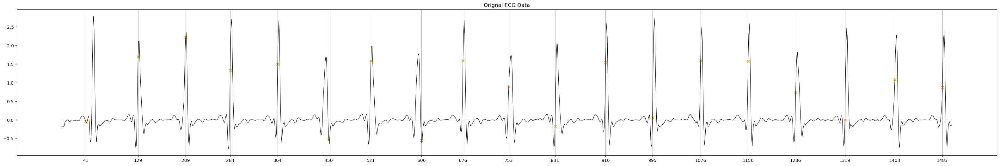

In [206]:
plt.figure(figsize=(40,6))
plt.title('Orignal ECG Data')
plt.plot(signal_flt_ex_3[:1500],color='black',linewidth=0.8)
plt.scatter(data_peaks, signal_flt_ex_3[:1500][data_peaks], color='orange', marker='x', label='R-peaks')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.xticks(data_peaks)
plt.grid(axis='x')
plt.show()



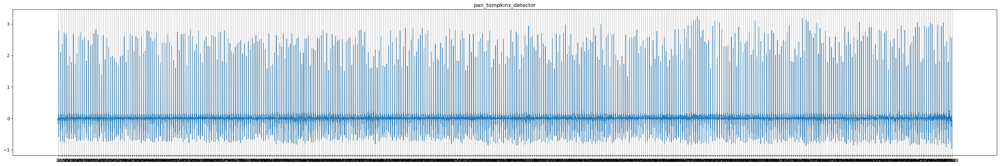

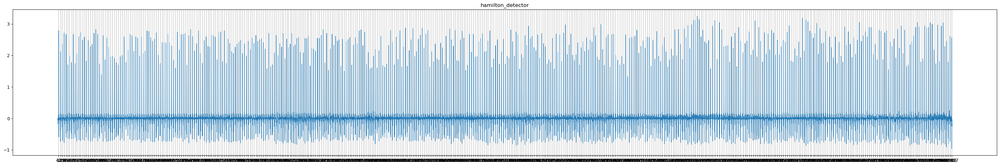

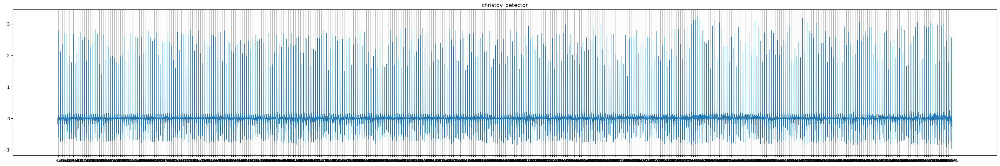

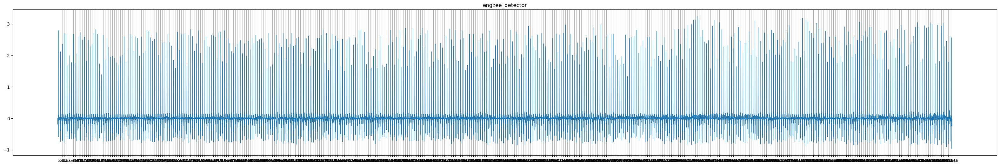

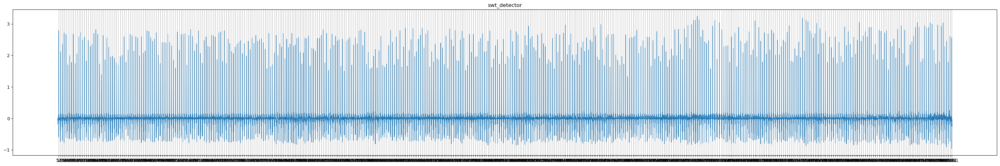

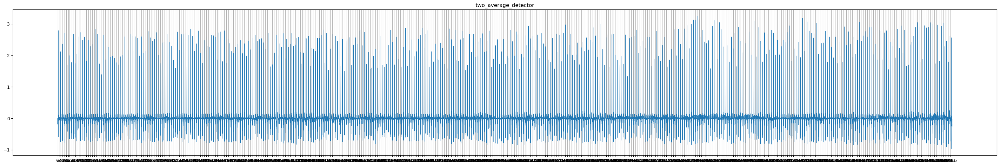

In [207]:
signalf_ex_3 = signal_flt_ex_3
for kd in detectors.keys():
    vd = detectors[kd]
    r_peaks = np.array(vd[0](np.hstack((signal_pad,signal_flt_ex_3)))) - signal_pad_samples
    vd[1] = r_peaks
    plt.figure(figsize=(40,6))
    plt.title(kd)
    plt.plot(signalf_ex_3,color='tab:blue',linewidth=0.8)
    #plt.hlines(0,0,1500,color='black', linewidth=0.4)
    plt.xticks(r_peaks)
    plt.grid(axis='x')
    plt.show()

In [208]:
detectors['christov_detector'][1]

array([   41,   129,   209,   284,   364,   450,   521,   606,   676,
         753,   831,   916,   995,  1076,  1156,  1236,  1319,  1403,
        1483,  1563,  1643,  1724,  1801,  1883,  1959,  2037,  2115,
        2195,  2275,  2355,  2438,  2520,  2604,  2690,  2771,  2855,
        2940,  3027,  3111,  3196,  3275,  3359,  3439,  3520,  3599,
        3679,  3759,  3839,  3919,  4000,  4080,  4160,  4239,  4323,
        4404,  4487,  4567,  4652,  4731,  4811,  4895,  4978,  5061,
        5143,  5223,  5307,  5387,  5467,  5548,  5631,  5711,  5795,
        5879,  5967,  6051,  6131,  6212,  6296,  6375,  6455,  6531,
        6611,  6692,  6767,  6846,  6923,  7003,  7081,  7160,  7238,
        7320,  7395,  7471,  7547,  7627,  7703,  7784,  7859,  7939,
        8023,  8107,  8187,  8272,  8351,  8431,  8511,  8591,  8671,
        8752,  8832,  8912,  8988,  9067,  9146,  9224,  9307,  9382,
        9459,  9539,  9615,  9687,  9760,  9836,  9907,  9984, 10055,
       10127, 10199,

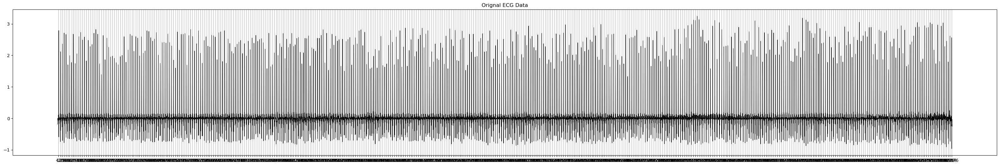

In [209]:
data_signal_1 = signalf_ex_3
data_peaks_1 = detectors['christov_detector'][1]

plt.figure(figsize=(40,6))
plt.title('Orignal ECG Data')
plt.plot(data_signal_1,color='black',linewidth=0.8)
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.xticks(data_peaks_1)
plt.grid(axis='x')
plt.show()

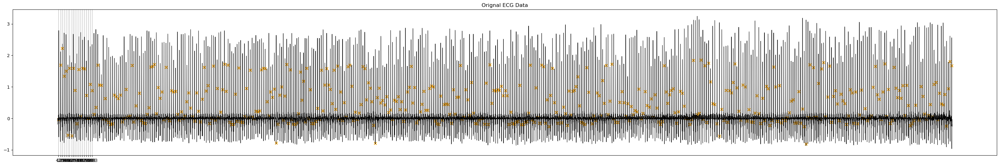

In [214]:
plt.figure(figsize=(40,6))
plt.title('Orignal ECG Data')
plt.plot(data_signal_1,color='black',linewidth=0.8)
plt.scatter(data_peaks_1, data_signal_1[data_peaks_1], color='orange', marker='x', label='R-peaks')
plt.hlines(0,0,1500,color='black', linewidth=0.4)
plt.xticks(data_peaks)
plt.grid(axis='x')
plt.show()
